# Introduction :
- The aim of our project is trying to solve three problems with the given Boston Airbnb dataset from two aspects, the hosts and the travellers. The problems are listed out below:
    - Help the host to decide the price based on the features of their listings provided
    - Help the travellers to choose the listings based on the non-null text features in listings dataset
    - Help the travellers to choose the listings based on the location and also the overall review scores
- We will try some regressors to solve the first problem and find the best regressor while k-mean algorithm to solve the second and the third.
- So basically, the first problem needs to solve with supervised learning model while the second and third can be solved using unsupervised learning

# Problem : Help the host to decide the price based on the features of the listing
- We hope to help the host to decide the price based on the features of their listings provided
- Task : Decide the price based on the features of the listing
- Performance : rmse between predicted values and true values
- Experience : A merged dataset after preprocessing listings.csv, reviews.csv, calendar.csv

# Import all the libraries needed


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from sklearn import preprocessing
from scipy.stats import pearsonr
from langdetect import detect
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


## Read the data and show some samples
- Convert price column in listing and calendar to numerical and remove the outliers

In [2]:
calendar = pd.read_csv('airbnb Boston/calendar.csv')
listings = pd.read_csv('airbnb Boston/listings.csv')
reviews = pd.read_csv("airbnb Boston/reviews.csv")
listings["price"] = listings["price"].map(lambda x: x.replace("$",'').replace(",",''), na_action = 'ignore')
listings["price"] = listings["price"].astype(float)
calendar['price'] = calendar['price'].replace('[\$,]', '', regex=True).astype(float)

listings.shape, reviews.shape, calendar.shape
# calendar.sample(3)
# reviews.sample(3)
# listings.sample(3)

((3585, 95), (68275, 6), (1308890, 4))

In [3]:
Q1 = listings["price"].quantile(0.25)
Q3 = listings["price"].quantile(0.75)
IQR = Q3 - Q1
outlier_id = (listings[(listings["price"] < (Q1 - 1.5 * IQR)) |(listings["price"] > (Q3 + 1.5 * IQR))])["id"].to_list()
# print(outlier_id)
listings = listings[~((listings["price"] < (Q1 - 1.5 * IQR)) |(listings["price"] > (Q3 + 1.5 * IQR)))]
listings.shape

(3461, 95)

In [4]:
for idx in outlier_id:
    reviews = reviews[reviews.listing_id != idx]
    calendar = calendar[calendar.listing_id != idx]   
reviews.shape, calendar.shape

((66927, 6), (1263630, 4))

In [5]:
Q1 = calendar["price"].quantile(0.25)
Q3 = calendar["price"].quantile(0.75)
IQR = Q3 - Q1
outlier_id = (calendar[(calendar["price"] < (Q1 - 1.5 * IQR)) |(calendar["price"] > (Q3 + 1.5 * IQR))])["listing_id"].to_list()
# print(outlier_id)
calendar = calendar[~((calendar["price"] < (Q1 - 1.5 * IQR)) |(calendar["price"] > (Q3 + 1.5 * IQR)))]
calendar.shape

(1249682, 4)

# Preprocessing of reviews.csv
- In this section, we will drop the empty and meaningless comments followed by language identification for each comment
- We left only the English comments since the majority of comments are English and this also help us to reduce the complexity especially the comments in Chinese
- After that, we perform sentiment analysis for all the comments left and get the new features : "compound", "positivity", "negativity", "neutrality" which will be used in price prediction
- Finally, we group the comments based on listing id and find the mean of each polarity scores

In [6]:
comments = reviews[["listing_id", "comments"]]
comments.groupby("listing_id").count().sort_values("comments", ascending=False)

,comments
listing_id,
66288,402
1497879,320
414419,312
31796,290
815639,281
...,...
13163259,1
7592616,1
7645862,1


## Drop the row with empty string and also meaningless comments
- Some comments are empty strings while some are just meaningless such as ".", "&&", so we drop those comments

In [7]:
comments = comments[comments.comments.notna()]
meaningless = [
    4361, 18136, 18457, 20327, 23992, 28737, 39504, 41402, 
    42686, 43643, 44592, 53055, 57343, 60731, 61431, 64654
]
comments.drop(meaningless, inplace=True)
comments.shape

(66858, 2)

# Identify the language of comments

In [8]:
lang = []

comments = comments.reset_index(drop=True)
for c in range(len(comments)):
    lang.append(detect(comments.iloc[c, 1]))

In [9]:
lang = pd.DataFrame(lang, columns=["language"])

combined = pd.concat([comments, lang], ignore_index=True, axis=1)

combined.columns = ["listing_id", "comment", "language"]
combined.groupby("language").count().sort_values(by="comment", ascending=False)

,listing_id,comment
language,,
en,63205,63205
fr,1345,1345
es,621,621
de,533,533
zh-cn,313,313
it,196,196
ko,119,119
pt,104,104
nl,69,69


- Since the majority comments are in English, we drop the comments in other language to reduce complexity especially Chinese

In [10]:
combined = combined[combined.language == "en"]
combined.drop('language', axis=1, inplace=True)
combined.groupby("listing_id").count().sort_values("comment", ascending=False)

,comment
listing_id,
66288,380
1497879,310
414419,299
815639,273
916123,271
...,...
9180965,1
6373729,1
9169272,1


## Perform sentiment analysis

In [11]:
sid = SentimentIntensityAnalyzer()
polarity_scores = [sid.polarity_scores(comment) for comment in combined["comment"]]

## Plot the frequency against polarity scores

<AxesSubplot:ylabel='Frequency'>

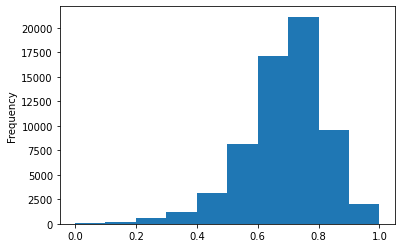

In [12]:
pd.Series([score['neu'] for score in polarity_scores]).plot(kind='hist')

<AxesSubplot:ylabel='Frequency'>

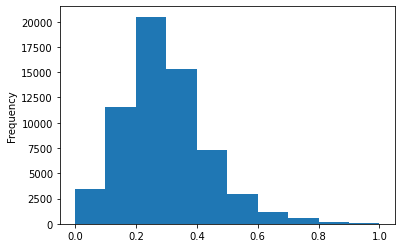

In [13]:
pd.Series([score['pos'] for score in polarity_scores]).plot(kind='hist')

<AxesSubplot:ylabel='Frequency'>

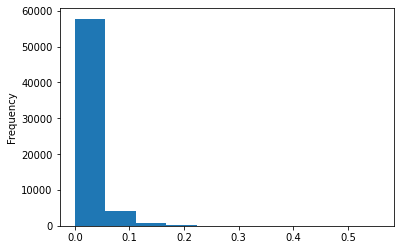

In [14]:
pd.Series([score['neg'] for score in polarity_scores]).plot(kind='hist')

In [15]:
combined['compound'] = [score['compound'] for score in polarity_scores]
combined['negativity'] = [score['neg'] for score in polarity_scores]
combined['neutrality'] = [score['neu'] for score in polarity_scores]
combined['positivity'] = [score['pos'] for score in polarity_scores]
combined

,listing_id,comment,compound,negativity,neutrality,positivity
0,1178162,My stay at islam's place was really cool! Good...,0.9626,0.000,0.648,0.352
1,1178162,Great location for both airport and city - gre...,0.9061,0.000,0.639,0.361
2,1178162,We really enjoyed our stay at Islams house. Fr...,0.9663,0.000,0.767,0.233
3,1178162,The room was nice and clean and so were the co...,0.9267,0.000,0.673,0.327
4,1178162,Great location. Just 5 mins walk from the Airp...,0.8658,0.000,0.637,0.363
...,...,...,...,...,...,...
66852,7462268,Wonderful location. Bus stop right at the corn...,0.8955,0.049,0.664,0.288
66854,7462268,Joe was on his way to Jamaica to be married! o...,0.9504,0.014,0.822,0.164
66855,7462268,The room was very clean as were the bathrooms ...,0.9693,0.000,0.784,0.216
66856,7462268,Staying in Lower Allston at Joe and Nancy's pl...,0.9957,0.014,0.759,0.226


## Group the comments based on listing id and find the mean of each polarity scores

In [16]:
mean_comments_score = combined.groupby("listing_id").mean().sort_values("compound", ascending=False)
mean_comments_score

,compound,negativity,neutrality,positivity
listing_id,,,,
12603280,0.99360,0.038,0.759,0.202
5584915,0.99285,0.004,0.704,0.292
12699603,0.99280,0.020,0.784,0.195
13655073,0.99210,0.000,0.556,0.444
5719606,0.99170,0.013,0.751,0.236
...,...,...,...,...
13218729,-0.57440,0.086,0.871,0.042
11987762,-0.59280,0.114,0.837,0.049
7245413,-0.78090,0.432,0.568,0.000


# Preprocessing of listing.csv
- In this section, we first get the names, data type and null values count of columns in it
- After that, we drop the columns with greater than 50% of missing values and also with unique value. At the same time, we drop the row without price.
- Then, we convert some columns with string into boolean and numerical.
- We drop all the irrelevant columns based on our experiences and plot the correlation heat map between every columns and visualize some remaining columns against price.
- Finally we perform one-hot-encoding on some of columns such as "neighbourhood_cleansed", "property_type" etc.

## Get the names and data type of columns in the listings

In [17]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3461 entries, 0 to 3584
Data columns (total 95 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3461 non-null   int64  
 1   listing_url                       3461 non-null   object 
 2   scrape_id                         3461 non-null   int64  
 3   last_scraped                      3461 non-null   object 
 4   name                              3461 non-null   object 
 5   summary                           3324 non-null   object 
 6   space                             2435 non-null   object 
 7   description                       3461 non-null   object 
 8   experiences_offered               3461 non-null   object 
 9   neighborhood_overview             2094 non-null   object 
 10  notes                             1558 non-null   object 
 11  transit                           2214 non-null   object 
 12  access

## Drop the columns which have more than 50% of missing values

In [18]:
nulls = listings.columns[listings.isnull().mean() > 0.5]
listings.drop(nulls, axis=1, inplace=True)

## Drop the columns with unique value

In [19]:
one_value_columns = [column for column in listings.columns if len(listings[column].unique()) == 1]
listings.drop(one_value_columns, axis=1, inplace=True)

## Drop the samples without price 

In [20]:
listings.dropna(subset=["price"])

,id,listing_url,name,summary,space,description,neighborhood_overview,transit,access,interaction,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12147973,https://www.airbnb.com/rooms/12147973,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...","Roslindale is quiet, convenient and friendly. ...","The bus stop is 2 blocks away, and frequent. B...","You will have access to 2 bedrooms, a living r...",NaN,...,NaN,NaN,NaN,NaN,f,moderate,f,f,1,NaN
1,3075044,https://www.airbnb.com/rooms/3075044,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,"The room is in Roslindale, a diverse and prima...",Plenty of safe street parking. Bus stops a few...,Apt has one more bedroom (which I use) and lar...,"If I am at home, I am likely working in my hom...",...,10.0,10.0,9.0,9.0,t,moderate,f,f,1,1.30
2,6976,https://www.airbnb.com/rooms/6976,Mexican Folk Art Haven in Boston,"Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...",The LOCATION: Roslindale is a safe and diverse...,"PUBLIC TRANSPORTATION: From the house, quick p...","I am living in the apartment during your stay,...","ABOUT ME: I'm a laid-back, friendly, unmarried...",...,10.0,10.0,9.0,10.0,f,moderate,t,f,1,0.47
3,1436513,https://www.airbnb.com/rooms/1436513,Spacious Sunny Bedroom Suite in Historic Home,Come experience the comforts of home away from...,Most places you find in Boston are small howev...,Come experience the comforts of home away from...,Roslindale is a lovely little neighborhood loc...,There are buses that stop right in front of th...,The basement has a washer dryer and gym area. ...,We do live in the house therefore might be som...,...,10.0,10.0,10.0,10.0,f,moderate,f,f,1,1.00
4,7651065,https://www.airbnb.com/rooms/7651065,Come Home to Boston,"My comfy, clean and relaxing home is one block...","Clean, attractive, private room, one block fro...","My comfy, clean and relaxing home is one block...","I love the proximity to downtown, the neighbor...",From Logan Airport and South Station you have...,You will have access to the front and side por...,I love my city and really enjoy sharing it wit...,...,10.0,10.0,9.0,10.0,f,flexible,f,f,1,2.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3580,8373729,https://www.airbnb.com/rooms/8373729,Big cozy room near T,5 min walking to Orange Line subway with 2 sto...,NaN,5 min walking to Orange Line subway with 2 sto...,NaN,NaN,NaN,NaN,...,10.0,10.0,8.0,9.0,t,strict,f,f,8,0.34
3581,14844274,https://www.airbnb.com/rooms/14844274,BU Apartment DexterPark Bright room,"Most popular apartment in BU, best located in ...",Best location in BU,"Most popular apartment in BU, best located in ...",NaN,"There is green line, BU shuttle in front of th...",NaN,NaN,...,NaN,NaN,NaN,NaN,f,strict,f,f,2,NaN
3582,14585486,https://www.airbnb.com/rooms/14585486,Gorgeous funky apartment,Funky little apartment close to public transpo...,Modern and relaxed space with many facilities ...,Funky little apartment close to public transpo...,"Cambridge is a short walk into Boston, and set...","Public transport is 5 minuts away, but walking...",The whole place including social areas is your...,NaN,...,NaN,NaN,NaN,NaN,f,flexible,f,f,1,NaN
3583,14603878,https://www.airbnb.com/rooms/14603878,Great Location; Train and Restaurants,"My place is close to Taco Loco Mexican Grill, ...",NaN,"My place is close to Taco Loco Mexican Grill, ...",NaN,NaN,NaN,NaN,...,9.0,9.0,8.0,7.0,f,strict,f,f,1,

## Convert some columns into numerical or boolean


In [21]:
for c in listings.columns:
  if len(pd.unique(listings[c])) == 2:
    listings[c] = (listings[c] == "t")

In [22]:
price_cols_index = listings.columns[listings.columns.str
                                    .contains('cleaning_fee|extra_people') == True]
for variable in price_cols_index:
    listings[variable] = listings[variable].map(lambda x: x.replace("$",'').replace(",",''),
                                                na_action = 'ignore')
    listings[variable] = listings[variable].astype(float)

rate_cols_index = listings.columns[listings.columns.str.contains('rate') == True]
for variable in rate_cols_index:
    listings[variable] = listings[variable].map(lambda x: x.replace("%",''),
                                                na_action = 'ignore')
    listings[variable] = listings[variable].astype(float)

listings['amenities_count'] = listings.amenities.str.count(',')+1
listings.drop('amenities', axis=1, inplace=True)

- Drop all the irrelevant columns
- Plot the relationship between price and some of the remaining columns

In [23]:
url_columns = listings.columns[listings.columns.str.contains('url') == True]
listings.drop(url_columns, axis=1, inplace=True)
listings = listings[listings.number_of_reviews!=0]

cols = ["name", 'host_id', 'latitude', 'longitude', 'calculated_host_listings_count', "host_total_listings_count", 
        "street", "zipcode", "market", "smart_location", "neighbourhood", "host_name", "host_neighbourhood",
        "host_about", "host_location", "is_location_exact", "city", 
        "summary", "space", "description", "neighborhood_overview", "transit", "access", "interaction", 
        "house_rules", "availability_30", "availability_60", "availability_90", "availability_365",
        'host_since', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_listings_count',
        "calendar_updated", "bed_type", "minimum_nights", "maximum_nights", "host_verifications", "cleaning_fee", 'host_has_profile_pic',
        'host_identity_verified', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification',
        "first_review", "last_review", "number_of_reviews", "reviews_per_month", "guests_included", "extra_people"
       ]

listings.drop(cols, axis=1, inplace=True)

<AxesSubplot:>

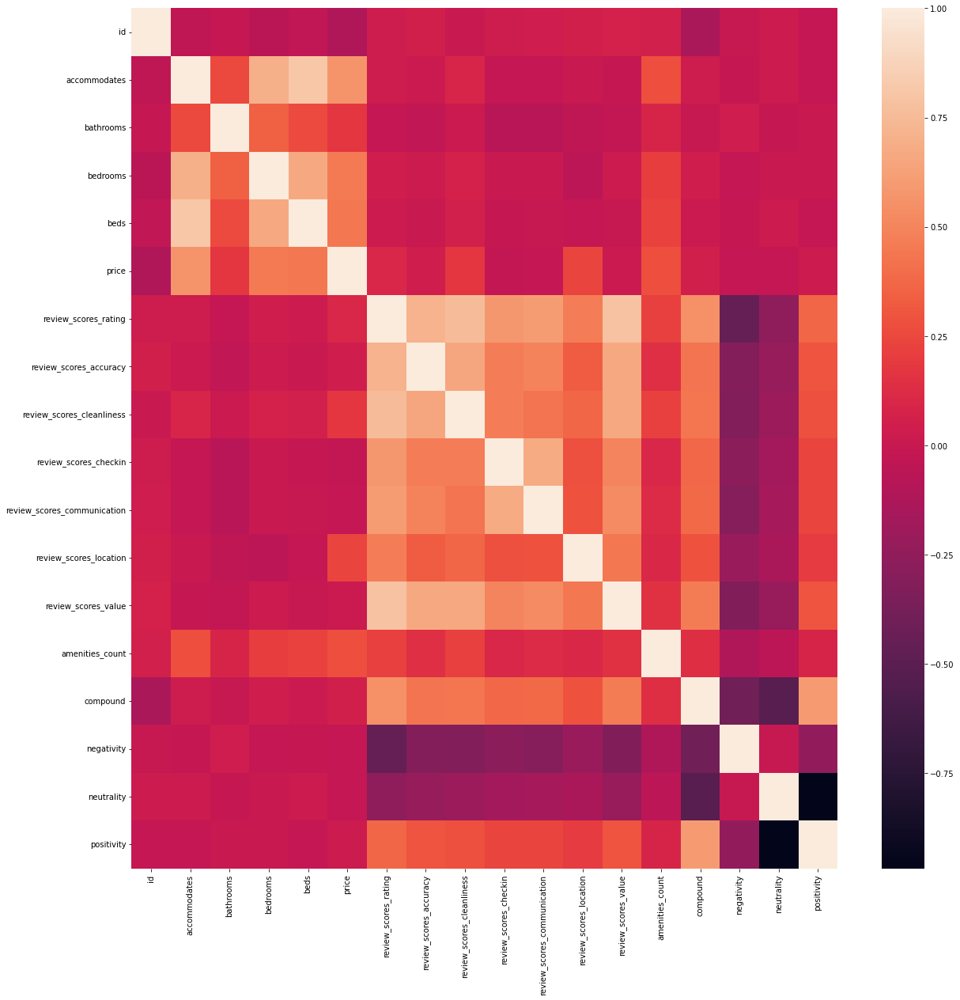

In [24]:
plt.figure(figsize=(20, 20))
sns.heatmap(
    pd.merge(listings, mean_comments_score, how="left", left_on="id", right_on="listing_id").corr()
)

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


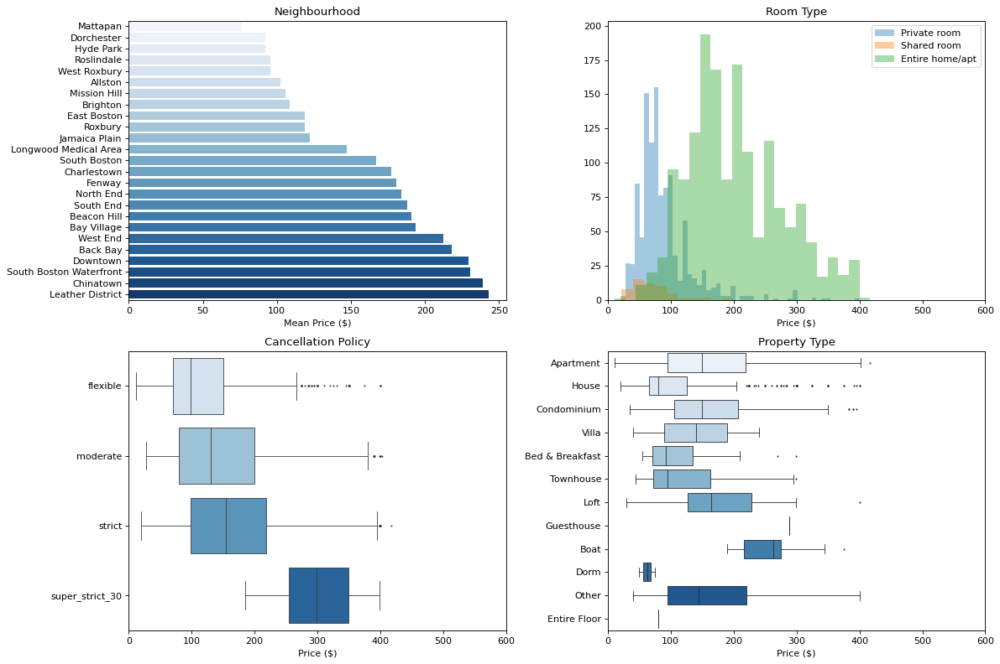

In [25]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi=80)

# Neighbourhoods
neighbourhoods = listings.groupby('neighbourhood_cleansed').agg(
    {
        'price': np.mean
    }
).reset_index()
sns.barplot(
    x='price', y='neighbourhood_cleansed',
    data=neighbourhoods.sort_values('price'),
    orient='h',
    palette='Blues',
    ax=axs[0, 0]
)
axs[0, 0].set_title('Neighbourhood')
axs[0, 0].set_xlabel('Mean Price ($)')
axs[0, 0].set_ylabel('')

sns.distplot(listings[listings.room_type == 'Private room']['price'],
             kde=False, ax=axs[0, 1], label='Private room')
sns.distplot(listings[listings.room_type == 'Shared room']['price'],
             kde=False, ax=axs[0, 1], label='Shared room')
sns.distplot(listings[listings.room_type == 'Entire home/apt']['price'],
             kde=False, ax=axs[0, 1], label='Entire home/apt')
axs[0, 1].set_xlim(0, 600)
axs[0, 1].set_title('Room Type')
axs[0, 1].set_xlabel('Price ($)')
axs[0, 1].legend()

# Cancellation Policy
sns.boxplot(x='price', y='cancellation_policy', fliersize=1, linewidth=0.75,
            data=listings, palette='Blues', ax=axs[1, 0],
            order=['flexible', 'moderate', 'strict', 'super_strict_30'])
axs[1, 0].set_xlim(0, 600)
axs[1, 0].set_title('Cancellation Policy')
axs[1, 0].set_xlabel('Price ($)')
axs[1, 0].set_ylabel('')

# Property type
sns.boxplot(x='price', y='property_type', fliersize=1, linewidth=0.75,
            data=listings, palette='Blues', ax=axs[1, 1])
axs[1, 1].set_xlim(0, 600)
axs[1, 1].set_title('Property Type')
axs[1, 1].set_xlabel('Price ($)')
axs[1, 1].set_ylabel('')

plt.tight_layout()
plt.show();

# Performing one-hot-encoding

In [26]:
neighbourhood = pd.get_dummies(listings["neighbourhood_cleansed"])
listings.drop("neighbourhood_cleansed", axis=1, inplace=True)

property_type = pd.get_dummies(listings["property_type"])
listings.drop("property_type", axis=1, inplace=True)

room_type = pd.get_dummies(listings["room_type"])
listings.drop("room_type", axis=1, inplace=True)

cancellation = pd.get_dummies(listings["cancellation_policy"])
listings.drop("cancellation_policy", axis=1, inplace=True)

listings = pd.concat([listings, neighbourhood, property_type, room_type, cancellation], axis=1)



# Preprocessing calendar.csv
- Convert the available columns to boolean
- Drop the samples without price given
- Find the mean of both available and price columns based on month
- Normalize both columns
- Find that they are highly correlated
- Drop the available column since it is actually covered by the price columns based on the correlation

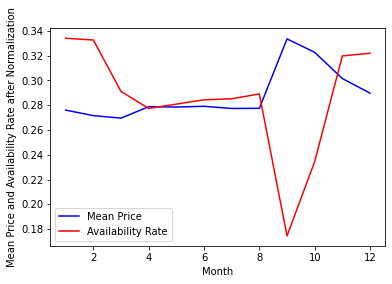

-0.7513731097870746

In [27]:
calendar['available'] = (calendar['available']=='t')
calendar['month'] = pd.DatetimeIndex(calendar['date']).month
ava_rate = calendar.groupby('month')['available'].mean()
ava_rate_norm = preprocessing.normalize([ava_rate])

calendar.dropna(subset=["price"], inplace=True)
mean_price = calendar.groupby('month')['price'].mean()
mean_price_norm = preprocessing.normalize([mean_price])

plt.figure()
month = [x for x in range(1, 13)]
plt.plot(month, mean_price_norm[0, :], "b", label="Mean Price")
plt.plot(month, ava_rate_norm[0, :], "r", label="Availability Rate")
plt.xlabel("Month")
plt.ylabel("Mean Price and Availability Rate after Normalization")
plt.legend()
plt.show()

corr, _ = pearsonr(ava_rate_norm[0, :], mean_price_norm[0, :])
corr

In [28]:
calendar.drop("available", axis=1, inplace=True)

In [29]:
month = pd.get_dummies(calendar["month"])
calendar.drop("date", axis=1, inplace=True)
calendar.drop("month", axis=1, inplace=True)
calendar = pd.concat([calendar, month], axis=1)
calendar.sample(10)

,listing_id,price,1,2,3,4,5,6,7,8,9,10,11,12
1022932,14826101,100.0,0,0,0,0,0,0,0,0,0,0,1,0
272463,9259184,245.0,1,0,0,0,0,0,0,0,0,0,0,0
148742,5510597,62.0,0,0,0,0,0,0,0,0,0,0,1,0
155607,13531200,74.0,0,1,0,0,0,0,0,0,0,0,0,0
131249,4065322,80.0,1,0,0,0,0,0,0,0,0,0,0,0
130700,8521792,110.0,0,0,0,0,0,0,1,0,0,0,0,0
209785,14251275,250.0,0,0,0,0,0,0,0,0,0,0,0,1
658352,3931204,219.0,0,0,0,0,0,0,0,0,0,0,0,1
907776,13824970,198.0,0,0,0,0,0,0,1,0,0,0,0,0
1015373,737519,120.0,0,0,0,0,0,1,0,0,0,0,0,0


# Merge the three prepared datasets

In [30]:
df = pd.merge(
    listings, calendar, how='left',
    left_on='id', right_on='listing_id',
)

df = df.drop(['price_x', 'listing_id' ], axis=1)
df = df.rename({'price_y': 'price'}, axis=1)

# Drop any remaining rows without a price value
df = df.dropna(subset=['price'])
df.rename(columns={1:"Jan", 2:"Feb", 3:"Mar", 4:"Apr", 5:"May", 6:"Jun", 7:"Jul", 8:"Aug", 9:"Sep", 10:"Oct",
                   11:"Nov", 12:"Dec"}, inplace=True)

df = pd.merge(df, mean_comments_score, how="left", left_on="id", right_on="listing_id")
df["compound"].fillna(df["compound"].mean(), inplace=True)
df["negativity"].fillna(df["negativity"].mean(), inplace=True)
df["neutrality"].fillna(df["neutrality"].mean(), inplace=True)
df["positivity"].fillna(df["positivity"].mean(), inplace=True)

In [31]:
df.shape

(496384, 74)

# Define a function to print and return the score of each model
- R Squared
- Root Mean Squared Error

In [32]:
def scores(model, X_train, y_train, X_test, y_test):
    """Print the R-squared and RMSE scores for the train and test set
    
    Parameters
        model: fitted regression model
    """
    
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)
    rmse_train = (mean_squared_error(y_train, y_pred_train))**0.5
    rmse_test = (mean_squared_error(y_test, y_pred_test))**0.5

    print(
        'Train R-squared: {:.5f}\tTrain RMSE: ${:.5f}\
        \nTest R-squared: {:.5f}\tTest RMSE: ${:.5f}'
        .format(r2_train, rmse_train, r2_test, rmse_test)
    )
    
    return r2_train, r2_test, rmse_train, rmse_test, y_pred_test

# Final Preparation
- Drop the rows with any null value
- Drop the id column 
- Drop the price column from training data

In [33]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

df.dropna(inplace=True)
df.drop("id", axis=1, inplace=True)

In [34]:
df.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'amenities_count',
       'Allston', 'Back Bay', 'Bay Village', 'Beacon Hill', 'Brighton',
       'Charlestown', 'Chinatown', 'Dorchester', 'Downtown', 'East Boston',
       'Fenway', 'Hyde Park', 'Jamaica Plain', 'Leather District',
       'Longwood Medical Area', 'Mattapan', 'Mission Hill', 'North End',
       'Roslindale', 'Roxbury', 'South Boston', 'South Boston Waterfront',
       'South End', 'West End', 'West Roxbury', 'Apartment', 'Bed & Breakfast',
       'Boat', 'Condominium', 'Dorm', 'Entire Floor', 'Guesthouse', 'House',
       'Loft', 'Other', 'Townhouse', 'Villa', 'Entire home/apt',
       'Private room', 'Shared room', 'flexible', 'moderate', 'strict',
       'super_strict_30', 'price', 'Jan', 'Feb', 'Mar', 'Apr', 

In [35]:
X = df.drop('price', axis=1)
print(X.shape)
y = df.price

(479741, 72)


# Models used:
- Linear model : 
    - Linear regression : Minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation, the mathematical equation is shown below :
    
    $$\min_{w}||Xw-y||^{2}_{2}$$
    
    - Lasso regression : Linear model that estimates sparse coefficients. It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent
    
    $$\min_{w}\frac{1}{2N}||Xw-y||^{2}_{2}+\alpha||w||_{1}$$
    
    - Ridge regression : Addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients, the mathematical equation is shown below :
    
    $$\min_{w}||Xw-y||^{2}_{2} + \alpha||w||^{2}_{2}$$
    
    - Elastic Net regression : Linear regression model trained with both  and -norm regularization of the coefficients. This combination allows for learning a sparse model where few of the weights are non-zero like Lasso, while still maintaining the regularization properties of Ridge.
    
    $$\min_{w}||Xw-y||^{2}_{2} + \alpha\rho||w||_{1} + \alpha\frac{1-\rho}{2}||w||^{2}_{2}$$
    
- Tree model : 
    - Decision tree regressor : A supervised learning method that create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.
- Ensemble model :
    - Random forest regressor : An ensemble technique capable of performing both regression and classification tasks with the use of multiple decision trees and a technique called Bootstrap and Aggregation, commonly known as bagging.
- KNeighbors model :
    - KNN regressor : Learning based on the nearest neighbors of each query point, where $k$ is an integer value specified by the user.

# Train and Validate

In [36]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from scipy.stats import uniform, truncnorm, randint
from time import time

model_scores = {}
time_used = []
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

## Linear regression
- Randomized Search Cross Validation

Train R-squared: 0.72591	Train RMSE: $52.01767        
Test R-squared: 0.72591	Test RMSE: $52.08867


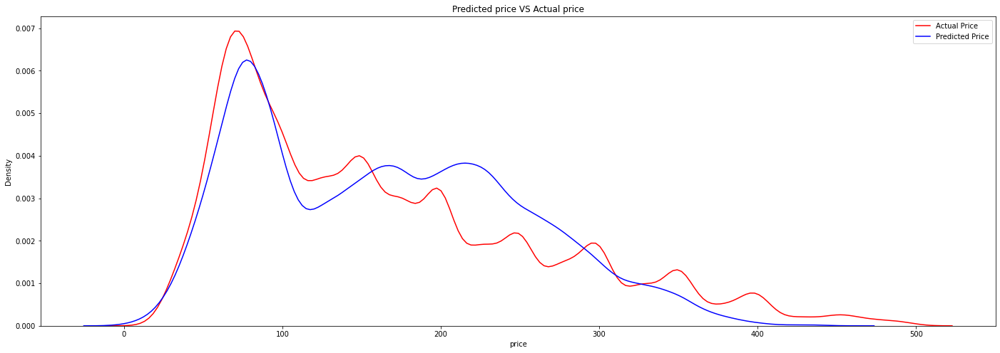

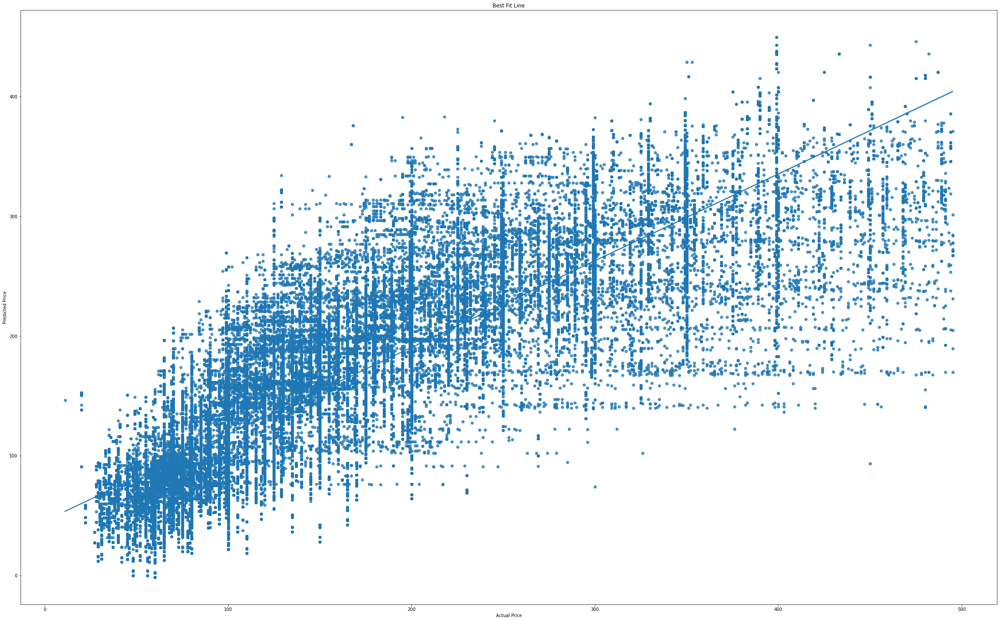

In [37]:
start = time()
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(linear_reg, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["linear_reg"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end-start)

## Lasso regression
- Randomized Search Cross Validation

0.7122488979412119
{'alpha': 0.251779734042831}
Train R-squared: 0.71235	Train RMSE: $53.28894        
Test R-squared: 0.71251	Test RMSE: $53.34744


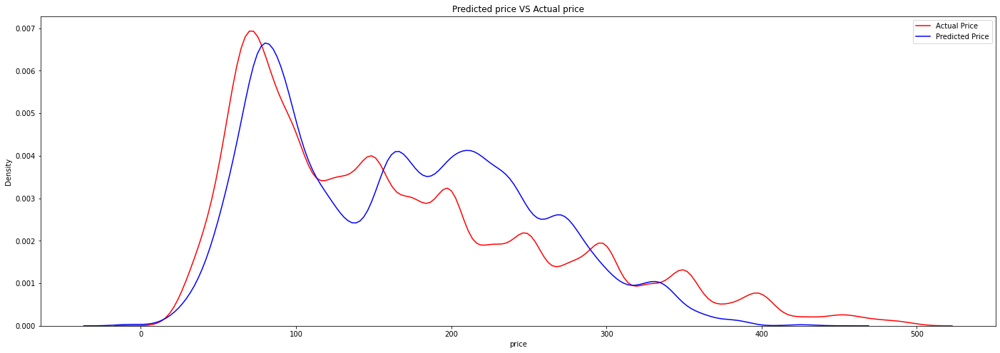

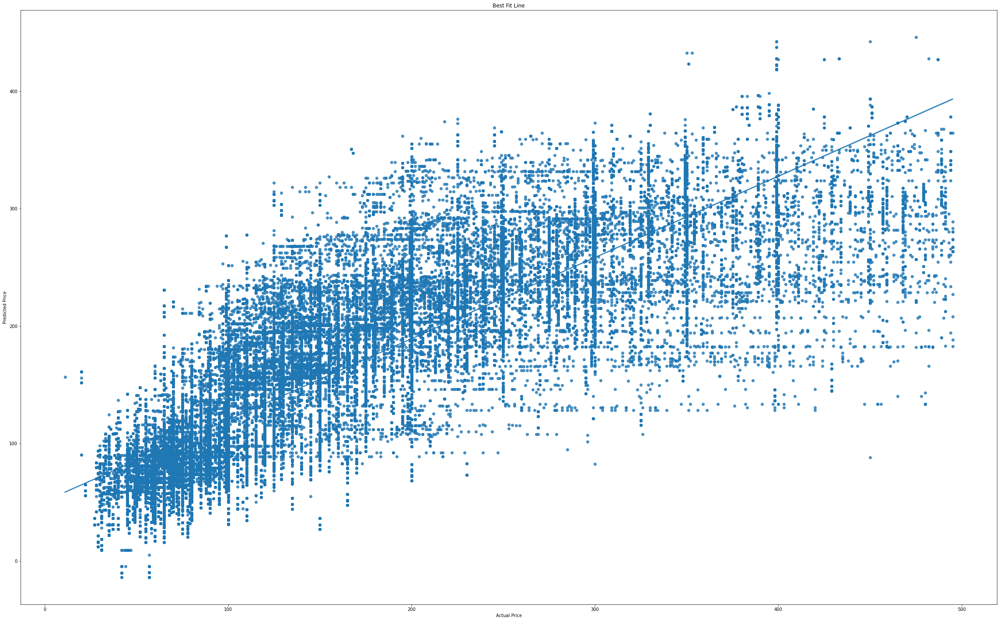

In [38]:
start = time()
lasso_params = {
    "alpha":truncnorm(a=0, b=1000, loc=0.25, scale=0.1),
}
lasso = Lasso()
RandomSearch = RandomizedSearchCV(lasso, lasso_params, n_jobs=-1)
RandomSearch.fit(X_train, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
lasso = Lasso(**RandomSearch.best_params_)
lasso.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(lasso, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)


fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
plt.legend()
ax1.set_title("Predicted price VS Actual price")
plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["lasso"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Ridge regression
- Randomized Search Cross Validation

0.7257706264033145
{'alpha': 0.2586452141494076}
Train R-squared: 0.72590	Train RMSE: $52.01809        
Test R-squared: 0.72591	Test RMSE: $52.08899


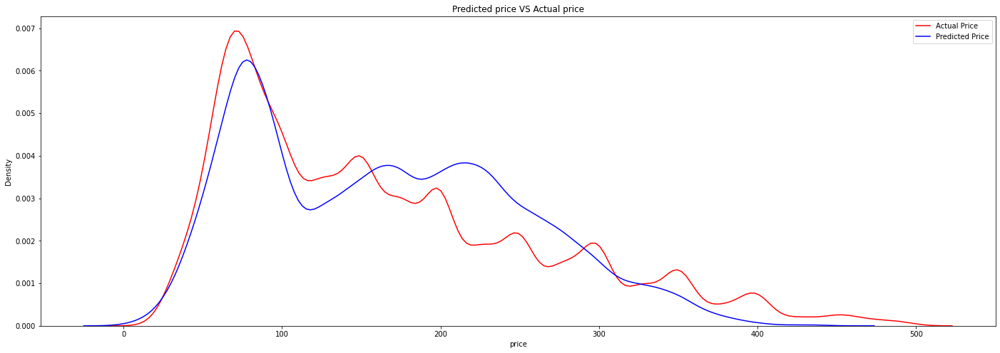

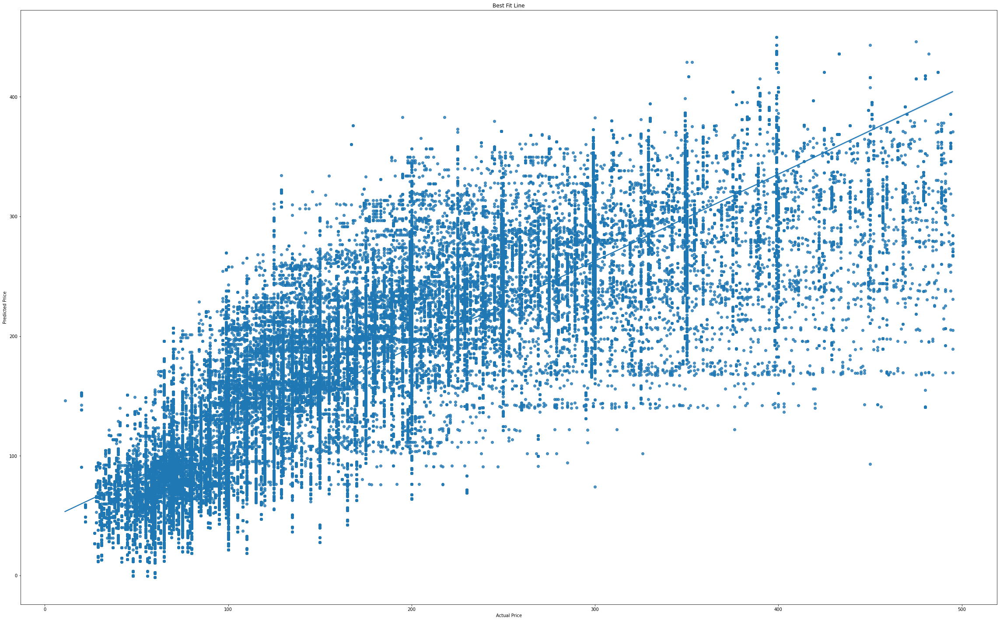

In [39]:
start = time()
ridge_params = {
    "alpha":truncnorm(a=0, b=1000, loc=0.25, scale=0.1),
}
ridge = Ridge()
RandomSearch = RandomizedSearchCV(ridge, ridge_params, n_jobs=-1)
RandomSearch.fit(X_train, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
ridge = Ridge(**RandomSearch.best_params_)
ridge.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(ridge, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)


fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["ridge"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Elastic Net regression
- Randomized Search Cross Validation

0.6902774054897427
{'alpha': 0.44131678789125306, 'l1_ratio': 0.9794655029903336}
Train R-squared: 0.69036	Train RMSE: $55.28786        
Test R-squared: 0.69071	Test RMSE: $55.33227


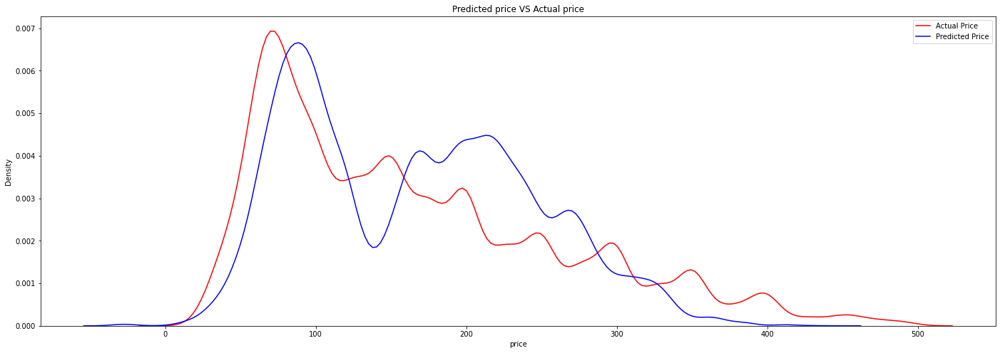

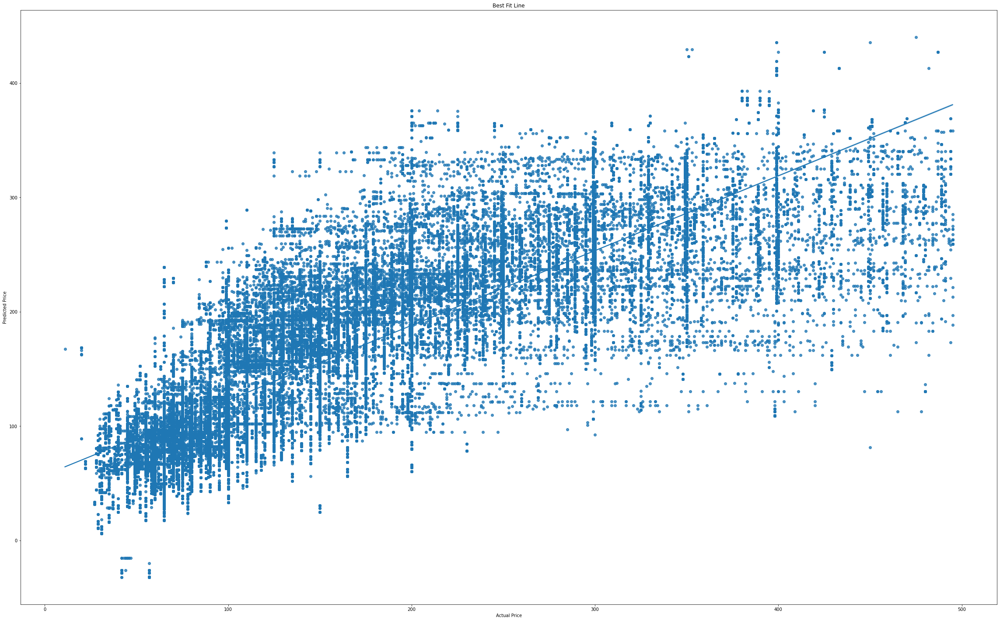

In [40]:
start = time()
EN_params = {
    "alpha":truncnorm(a=0, b=1000, loc=0.25, scale=0.1),
    "l1_ratio":uniform(0, 1)
}
EN = ElasticNet()
RandomSearch = RandomizedSearchCV(EN, EN_params, n_jobs=-1)
RandomSearch.fit(X_train, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
EN = ElasticNet(**RandomSearch.best_params_)
EN.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(EN, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)


fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()
plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["EN"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Decision Tree regressor
- Grid Search Cross Validation
- Randomized Search Cross Validation

0.9739184484111416
{'max_depth': 100, 'min_samples_split': 10}
Train R-squared: 0.97790	Train RMSE: $14.76953        
Test R-squared: 0.97374	Test RMSE: $16.12358
Time used =  57.226911306381226



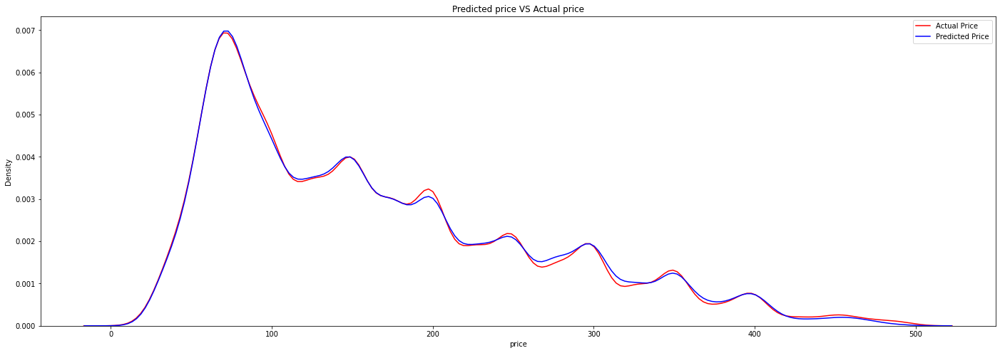

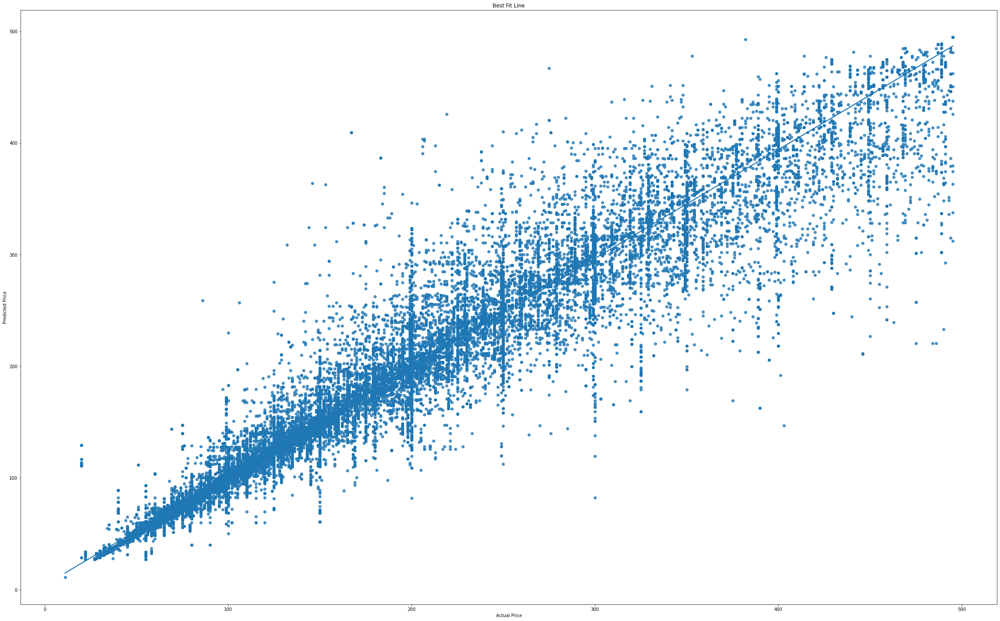

0.9670099386469737
{'max_depth': 963, 'min_samples_split': 47}
Train R-squared: 0.97259	Train RMSE: $16.44928        
Test R-squared: 0.96800	Test RMSE: $17.79884
Time used =  50.851953744888306


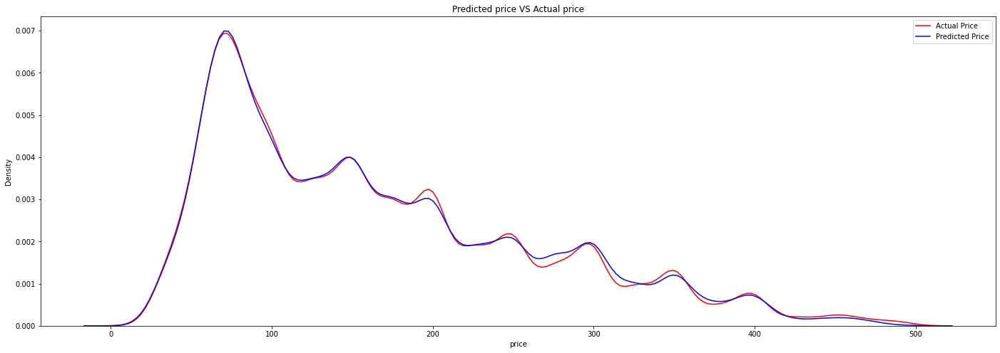

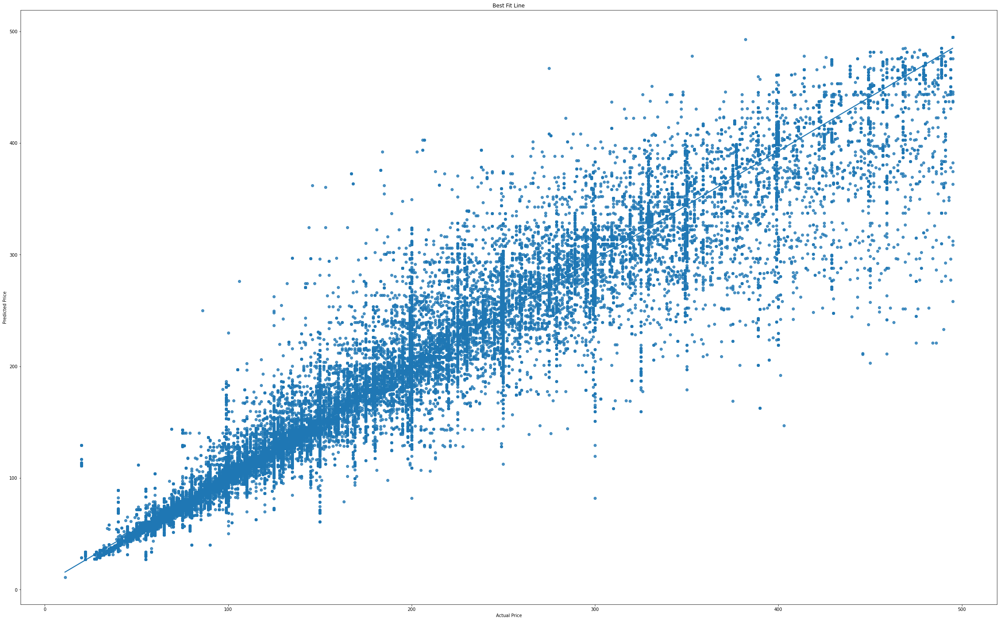

In [41]:
start = time()
tree_params = {
    "max_depth":[10, 100, 1000,], 
    "min_samples_split":[10, 50, 100, 1000]
    }
dtr = DecisionTreeRegressor()
GridSearch = GridSearchCV(dtr, tree_params, n_jobs=-1)
GridSearch.fit(X_train, y_train)
print(GridSearch.best_score_)
print(GridSearch.best_params_)
dtr = DecisionTreeRegressor(**GridSearch.best_params_)
dtr.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(dtr, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)
print()

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["gridsearch_dtr"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

start = time()
tree_params = {
    "max_depth":randint(1, 1000), 
    "min_samples_split":randint(1, 1000)
    }
dtr = DecisionTreeRegressor()
RandomSearch = RandomizedSearchCV(dtr, tree_params, n_jobs=-1)
RandomSearch.fit(X_train, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
dtr = DecisionTreeRegressor(**RandomSearch.best_params_)
dtr.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(dtr, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["randomsearch_dtr"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Random Forest regressor
- Grid Search Cross Validation
- Randomized Search Cross Validation

0.9741230406173175
{'n_estimators': 50}
Train R-squared: 0.97791	Train RMSE: $14.76759        
Test R-squared: 0.97392	Test RMSE: $16.06758


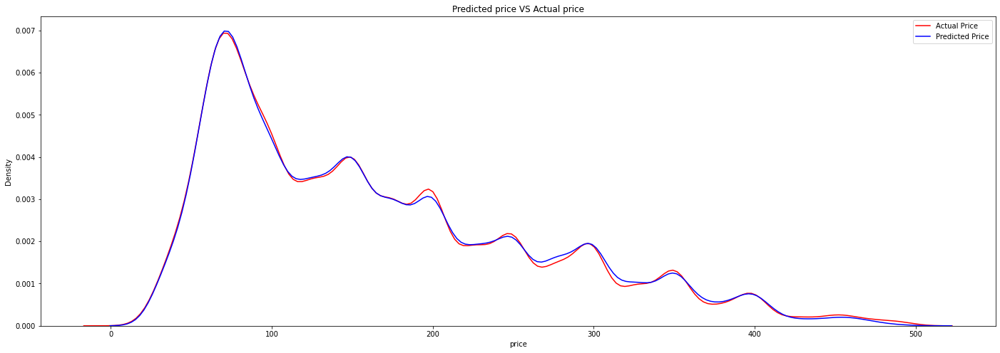

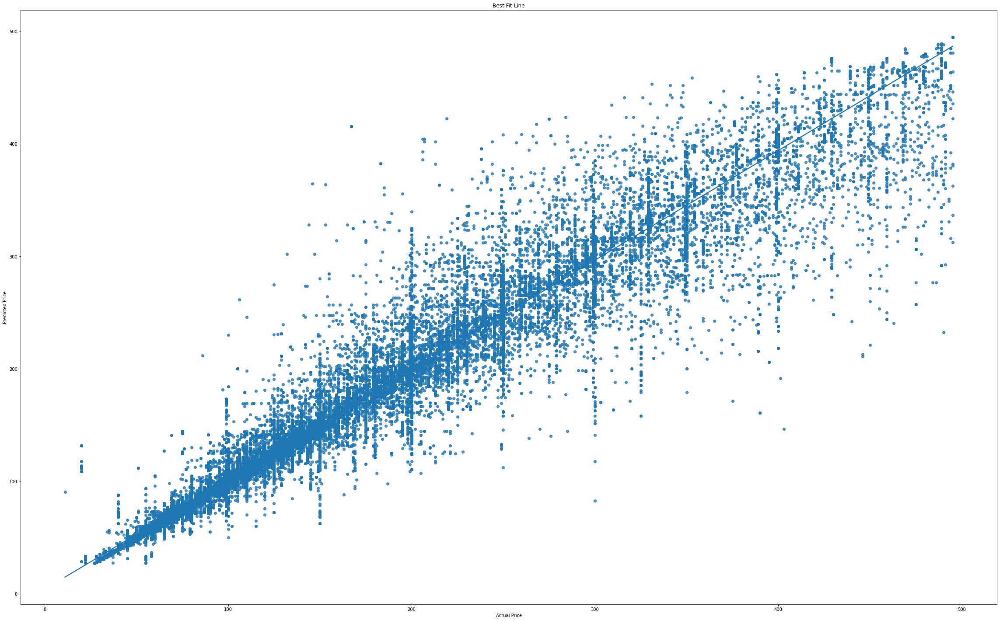

0.9741245942801873
{'n_estimators': 46}
Train R-squared: 0.97790	Train RMSE: $14.77016        
Test R-squared: 0.97395	Test RMSE: $16.05809


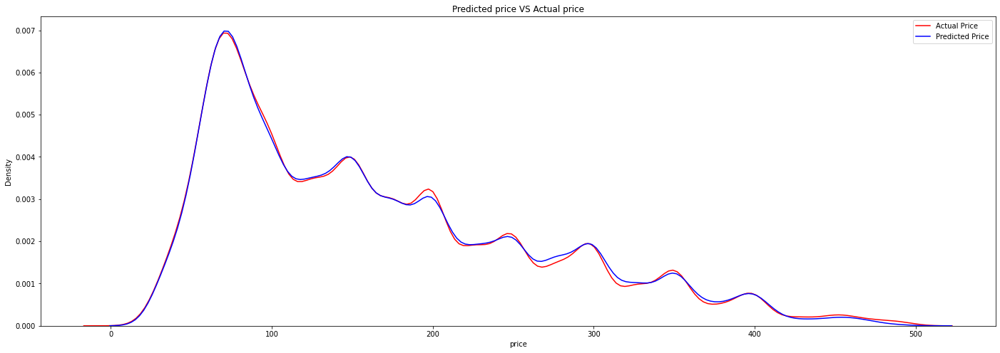

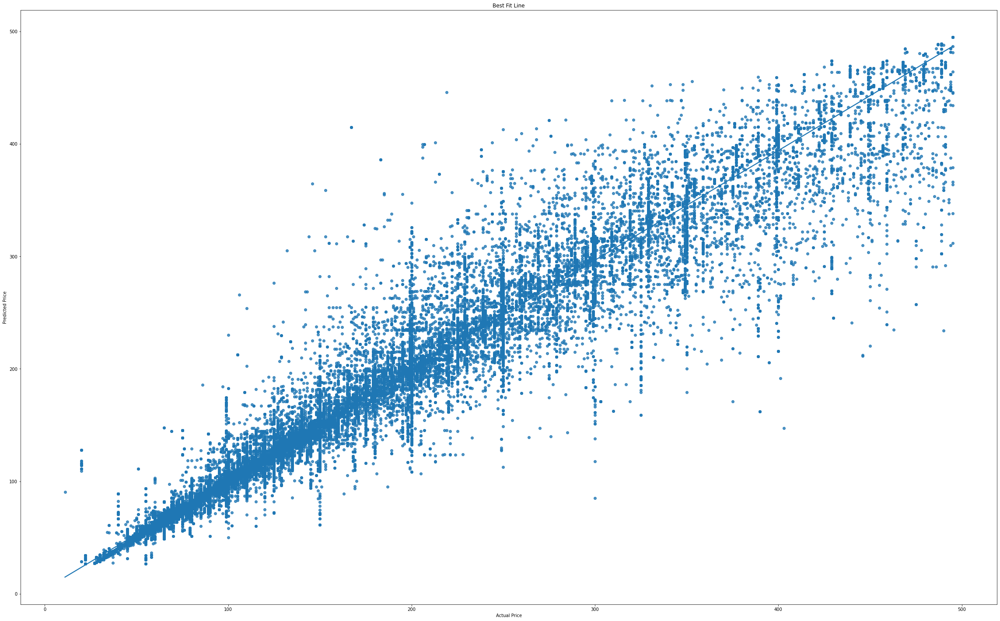

In [42]:
start = time()
forest_params = {
    'n_estimators':[30, 40, 50],
}
rf = RandomForestRegressor()
GridSearch = GridSearchCV(rf, forest_params, n_jobs=-1)
GridSearch.fit(X_train, y_train)
print(GridSearch.best_score_)
print(GridSearch.best_params_)
rf = RandomForestRegressor(**GridSearch.best_params_)
rf.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(rf, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["gridsearch_rf"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

start = time()
forest_params = {
    'n_estimators':randint(21, 50),
    }
rf = RandomForestRegressor()
RandomSearch = RandomizedSearchCV(rf, forest_params, n_jobs=-1)
RandomSearch.fit(X_train, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
rf = RandomForestRegressor(**RandomSearch.best_params_)
rf.fit(X_train, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(rf, X_train, y_train, X_test, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["randomsearch_rf"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Before we try with more models, we perform PCA to reduce the dimensions of our data or else the computational time such as KNN will be extremely long

In [43]:
from sklearn.decomposition import PCA
pca = PCA(n_components=X_train.shape[1])
pca.fit(X_train)

PCA(n_components=72)

In [44]:
X_pca = pca.transform(X_train)
n_pcs = pca.components_.shape[0]
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]
initial_feature_names = list(X_train.columns)
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
pca_analysis = pd.DataFrame(list(zip(most_important_names, pca.explained_variance_ratio_)))
print(pca_analysis.to_string())

                              0             1
0          review_scores_rating  7.175511e-01
1               amenities_count  1.934656e-01
2                  accommodates  3.238394e-02
3        review_scores_location  7.350258e-03
4     review_scores_cleanliness  5.722812e-03
5   review_scores_communication  4.438214e-03
6        review_scores_location  3.902647e-03
7                        strict  3.142568e-03
8        review_scores_accuracy  2.843517e-03
9           review_scores_value  2.193064e-03
10                     bedrooms  2.071605e-03
11                    bathrooms  1.780286e-03
12                     flexible  1.732826e-03
13                 Private room  1.603897e-03
14  review_scores_communication  1.556051e-03
15                     bedrooms  1.349048e-03
16                Jamaica Plain  8.490577e-04
17                          Jan  8.264128e-04
18                          Dec  7.827346e-04
19                          Feb  7.508081e-04
20                          Nov  7

## Carry out dimension reduction
- Use the top principal components that retain 95% of data

In [45]:
pca_95 = PCA(.95)
pca_95.fit(X_train)
X_pca = pca_95.transform(X_train)
n_pcs= pca_95.components_.shape[0]
most_important = [np.abs(pca_95.components_[i]).argmax() for i in range(n_pcs)]
initial_feature_names = list(X_train.columns)
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]
pca_analysis = pd.DataFrame(list(zip(most_important_names, pca.explained_variance_ratio_)))
pca_analysis

,0,1
0,review_scores_rating,0.717551
1,amenities_count,0.193466
2,accommodates,0.032384
3,review_scores_location,0.007350


In [46]:
X_train_reduced = pca_95.transform(X_train)
X_test_reduced = pca_95.transform(X_test)

## Linear regression with reduced data

Train R-squared: 0.50874	Train RMSE: $69.63983        
Test R-squared: 0.51143	Test RMSE: $69.54449


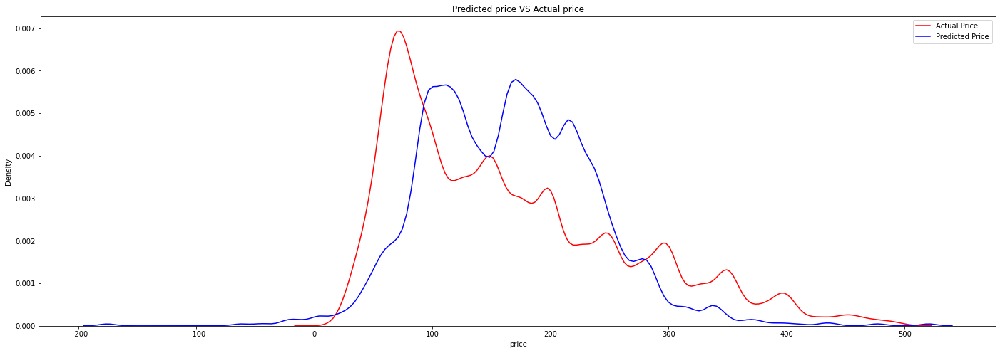

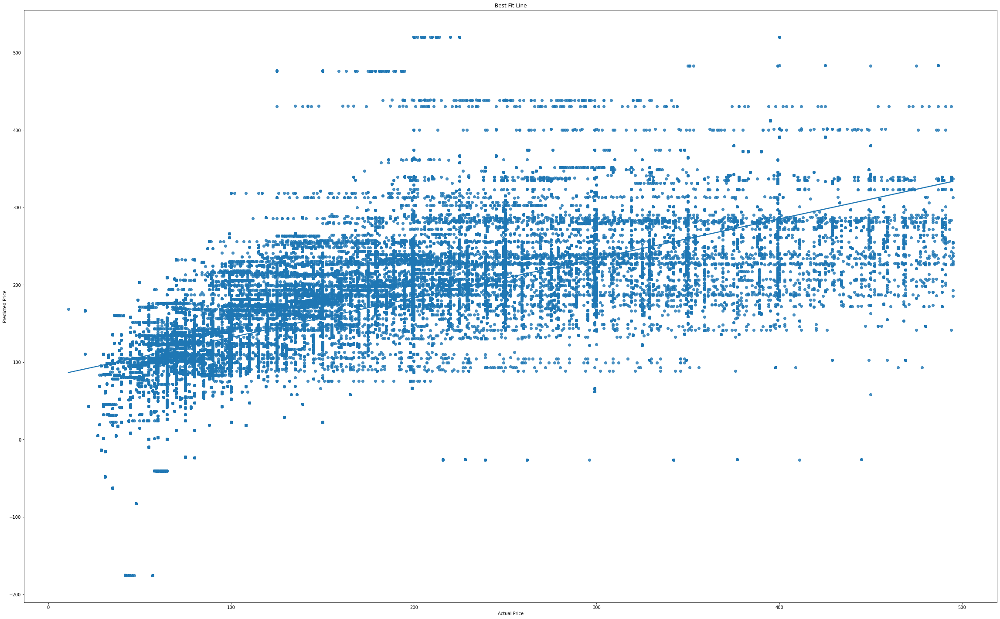

In [47]:
start = time()
linear_reg = LinearRegression()
linear_reg.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(linear_reg, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["pca_linear_reg"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end-start)

## Lasso regression with reduced data

0.5086978378583864
{'alpha': 0.2562450770325762}
Train R-squared: 0.50873	Train RMSE: $69.64051        
Test R-squared: 0.51142	Test RMSE: $69.54515


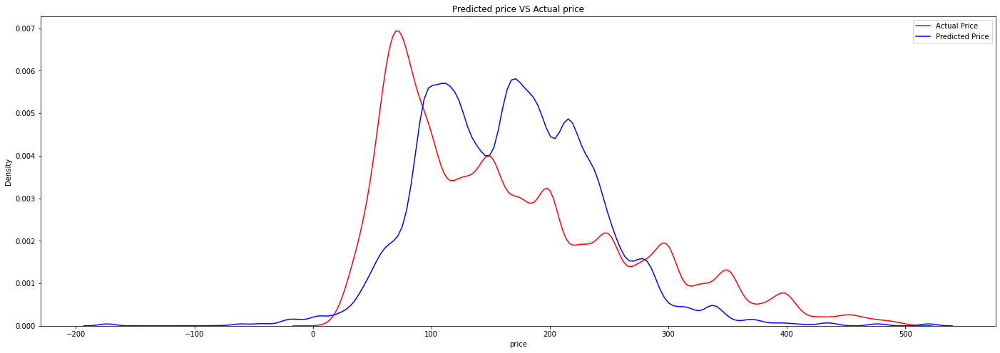

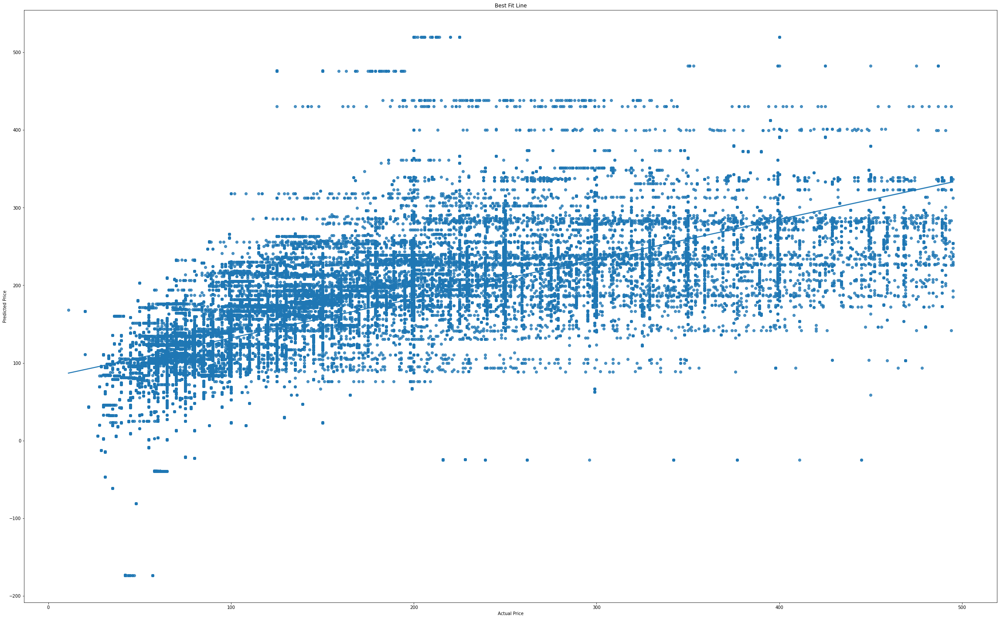

In [48]:
start = time()
lasso_params = {
    "alpha":truncnorm(a=0, b=1000, loc=0.25, scale=0.1),
}
lasso = Lasso()
RandomSearch = RandomizedSearchCV(lasso, lasso_params, n_jobs=-1)
RandomSearch.fit(X_train_reduced, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
lasso = Lasso(**RandomSearch.best_params_)
lasso.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(lasso, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
plt.legend()
ax1.set_title("Predicted price VS Actual price")
plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["pca_lasso"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Ridge regression with reduced data

0.5087072821508947
{'alpha': 0.4515637595335892}
Train R-squared: 0.50874	Train RMSE: $69.63983        
Test R-squared: 0.51143	Test RMSE: $69.54449


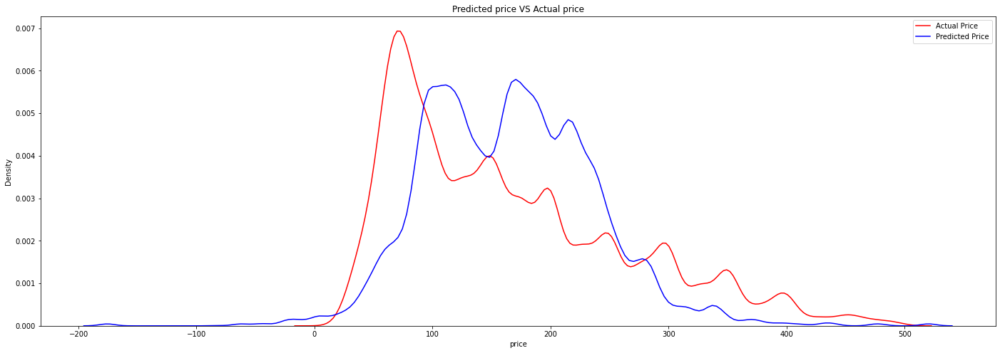

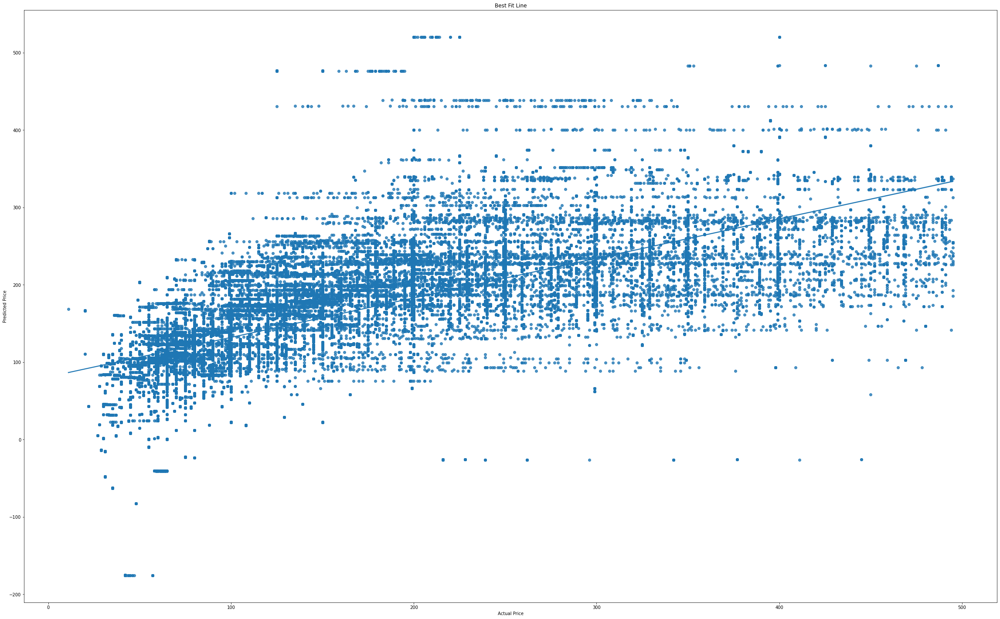

In [49]:
start = time()
ridge_params = {
    "alpha":truncnorm(a=0, b=1000, loc=0.25, scale=0.1),
}
ridge = Ridge()
RandomSearch = RandomizedSearchCV(ridge, ridge_params, n_jobs=-1)
RandomSearch.fit(X_train_reduced, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
ridge = Ridge(**RandomSearch.best_params_)
ridge.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(ridge, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["pca_ridge"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Elastic Net regression with reduced data

0.5086199424271831
{'alpha': 0.2536516886166129, 'l1_ratio': 0.9409786705806932}
Train R-squared: 0.50865	Train RMSE: $69.64607        
Test R-squared: 0.51135	Test RMSE: $69.55027


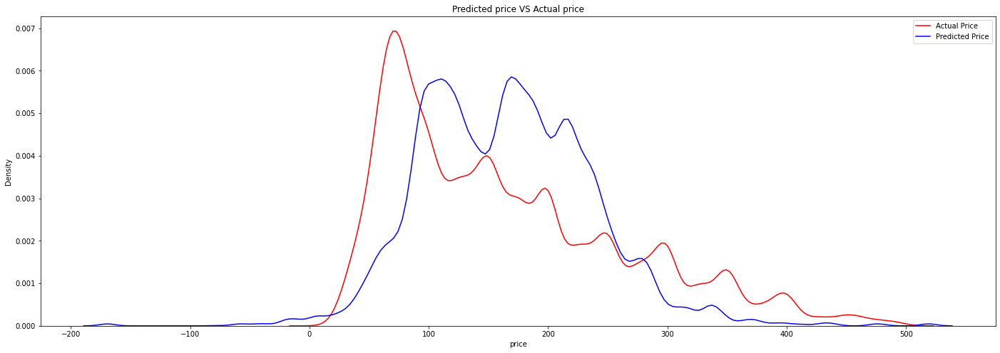

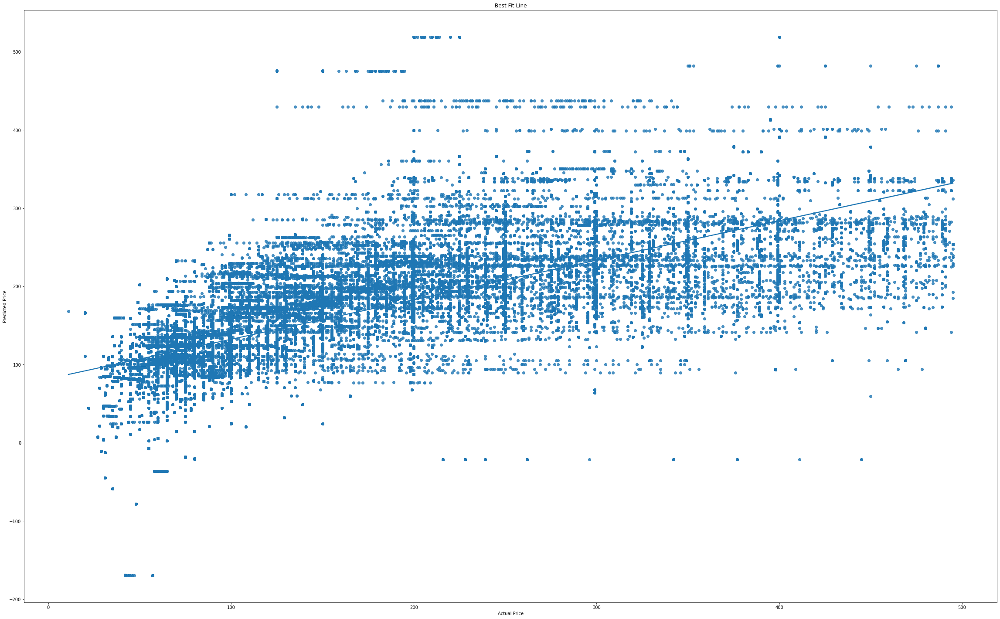

In [50]:
start = time()
EN_params = {
    "alpha":truncnorm(a=0, b=1000, loc=0.25, scale=0.1),
    "l1_ratio":uniform(0, 1)
}
EN = ElasticNet()
RandomSearch = RandomizedSearchCV(EN, EN_params, n_jobs=-1)
RandomSearch.fit(X_train_reduced, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
EN = ElasticNet(**RandomSearch.best_params_)
EN.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(EN, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()
plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["pca_EN"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## KNN regressor with reduced data
- Try KNN regressor with and without standardized data since it may affect the result of KNN which sensitive to the scale of data

0.9742556226863108
{'n_neighbors': 25, 'weights': 'distance'}
Train R-squared: 0.97798	Train RMSE: $14.74299        
Test R-squared: 0.97413	Test RMSE: $16.00373


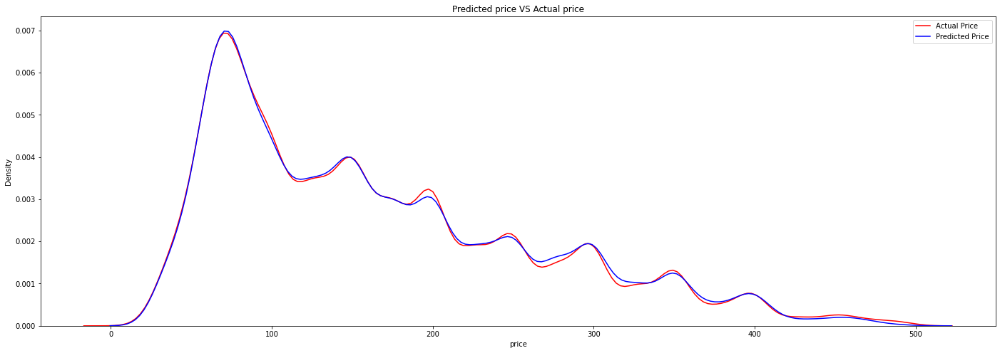

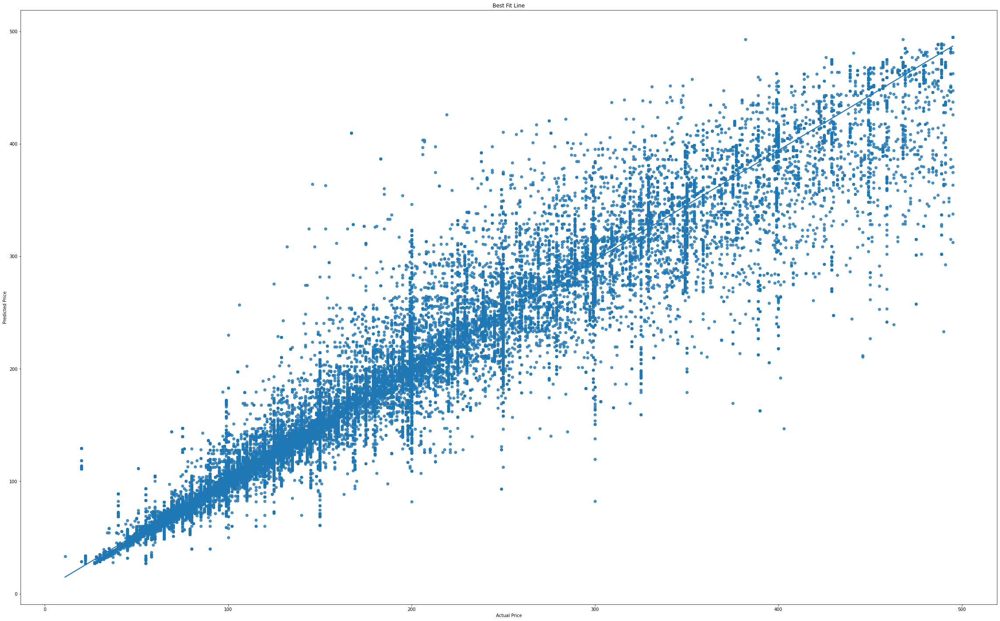

0.9742549704878648
{'n_neighbors': 30, 'weights': 'distance'}
Train R-squared: 0.97798	Train RMSE: $14.74267        
Test R-squared: 0.97412	Test RMSE: $16.00638


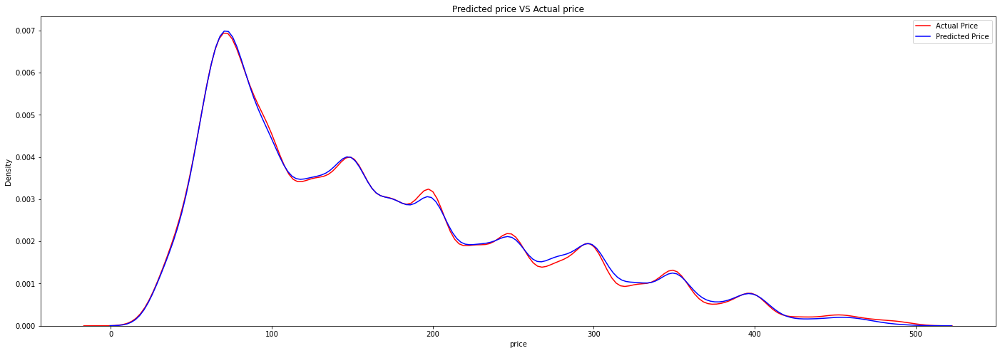

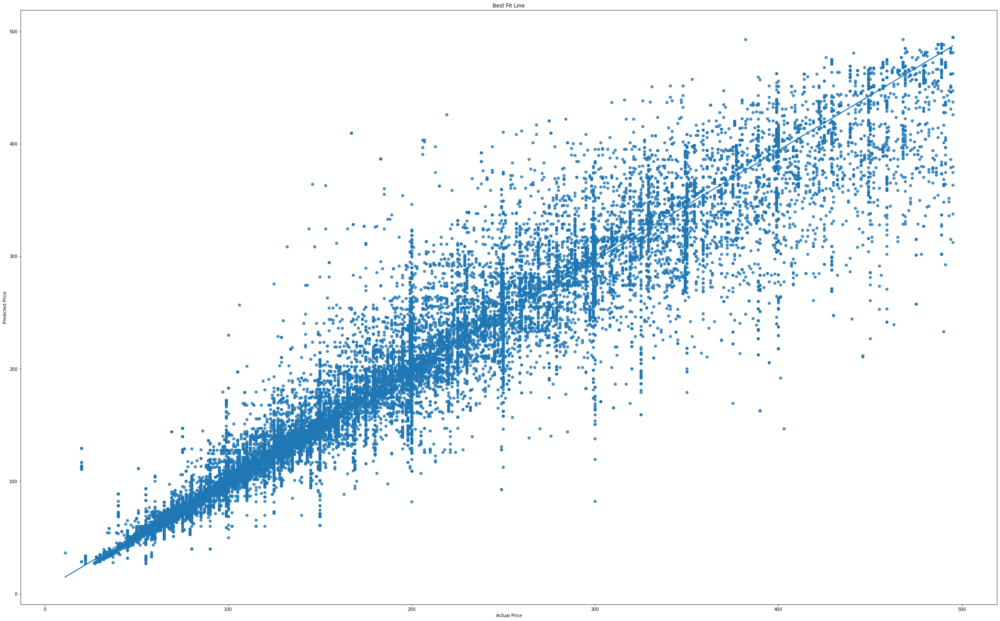

In [51]:
from sklearn.neighbors import KNeighborsRegressor

start = time()
knn_params = {
    "n_neighbors" : [5, 10, 15, 20, 25, 30],
    "weights" : ["uniform", "distance"]
}
knn = KNeighborsRegressor()
GridSearch = GridSearchCV(knn, knn_params, n_jobs=-1)
GridSearch.fit(X_train_reduced, y_train)
print(GridSearch.best_score_)
print(GridSearch.best_params_)
knn = KNeighborsRegressor(**GridSearch.best_params_)
knn.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(knn, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["gridsearch_knn"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

start = time()
knn_params = {
    "n_neighbors" : randint(1, 50),
    "weights" : ["uniform", "distance"]
}
knn = KNeighborsRegressor()
RandomSearch = RandomizedSearchCV(knn, knn_params, n_jobs=-1)
RandomSearch.fit(X_train_reduced, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
knn = KNeighborsRegressor(**RandomSearch.best_params_)
knn.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(knn, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["randomsearch_knn"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Decision Tree Regressor with reduced data

0.9741771432044086
{'max_depth': 100, 'min_samples_split': 10}
Train R-squared: 0.97796	Train RMSE: $14.75183        
Test R-squared: 0.97410	Test RMSE: $16.01216
Time used =  8.21697473526001



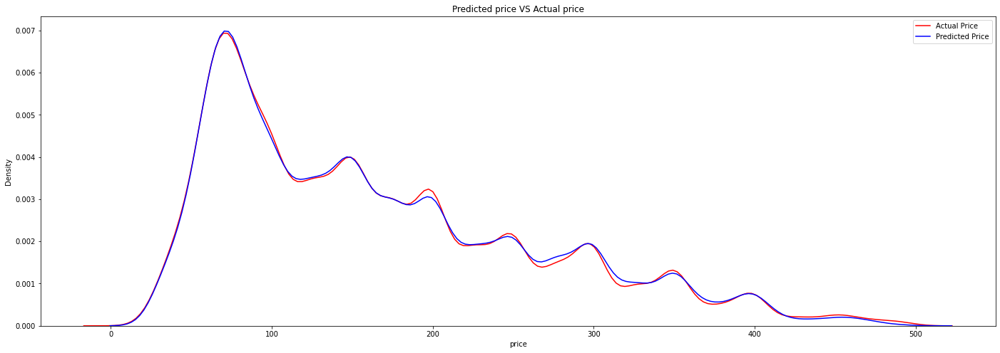

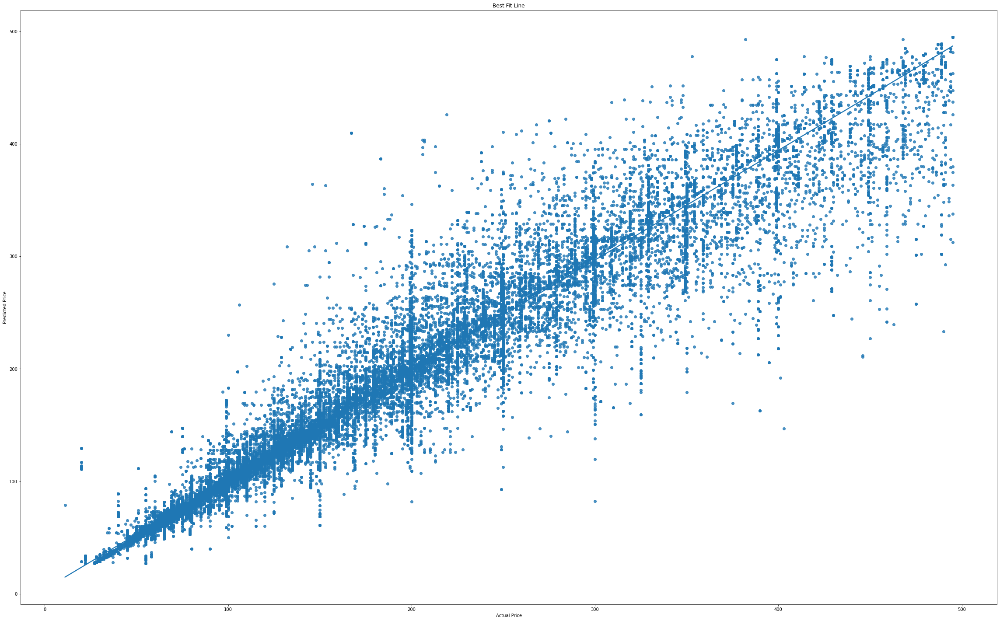

0.9599374218747865
{'max_depth': 709, 'min_samples_split': 110}
Train R-squared: 0.96696	Train RMSE: $18.06070        
Test R-squared: 0.96320	Test RMSE: $19.08568
Time used =  7.064450979232788



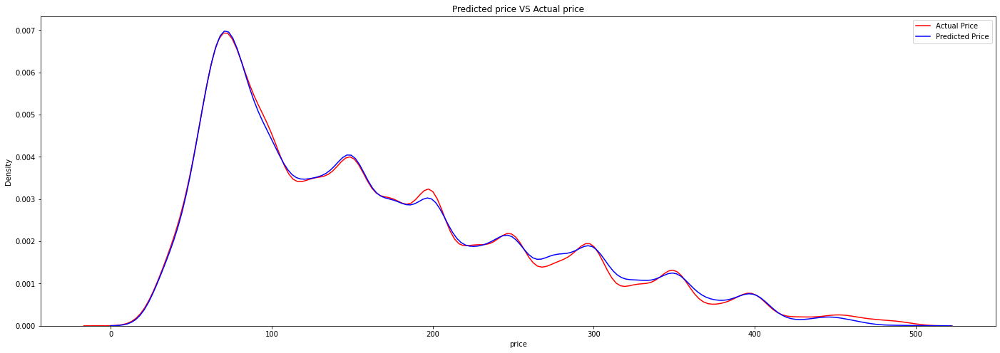

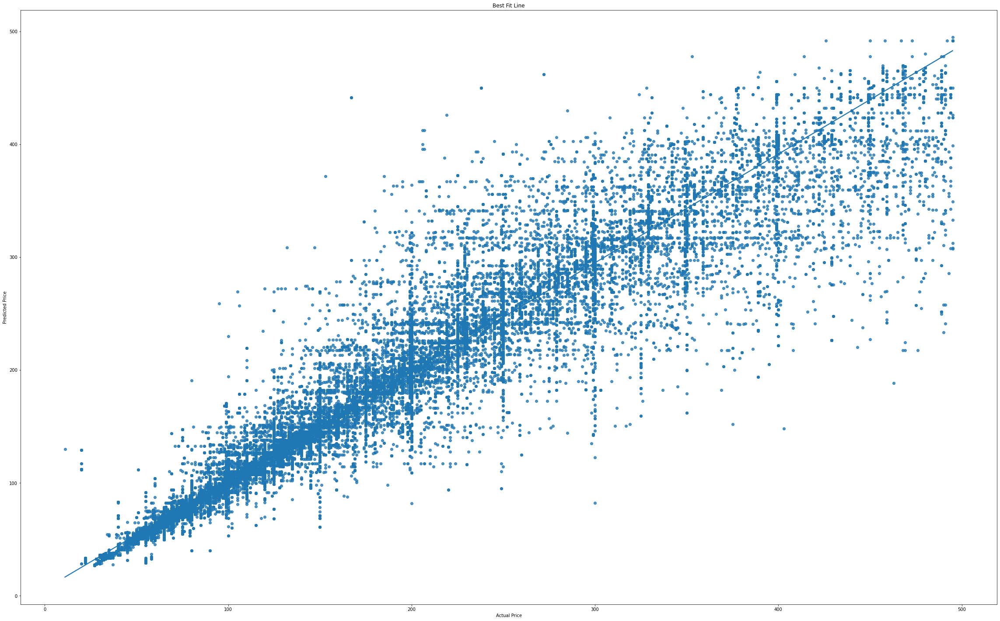

In [56]:
start = time()
tree_params = {
    "max_depth":[10, 100, 1000,], 
    "min_samples_split":[10, 50, 100, 1000]
    }
dtr = DecisionTreeRegressor()
GridSearch = GridSearchCV(dtr, tree_params, n_jobs=-1)
GridSearch.fit(X_train_reduced, y_train)
print(GridSearch.best_score_)
print(GridSearch.best_params_)
dtr = DecisionTreeRegressor(**GridSearch.best_params_)
dtr.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(dtr, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)
print()

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["gridsearch_pca_dtr"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

start = time()
tree_params = {
    "max_depth":randint(1, 1000), 
    "min_samples_split":randint(1, 1000)
    }
dtr = DecisionTreeRegressor()
RandomSearch = RandomizedSearchCV(dtr, tree_params, n_jobs=-1)
RandomSearch.fit(X_train_reduced, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
dtr = DecisionTreeRegressor(**RandomSearch.best_params_)
dtr.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(dtr, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)
print()

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["randomsearch_pca_dtr"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Random forest regressor with reduced data

0.974261939904736
{'n_estimators': 50}
Train R-squared: 0.97793	Train RMSE: $14.76202        
Test R-squared: 0.97410	Test RMSE: $16.01335
Time used =  108.57093334197998


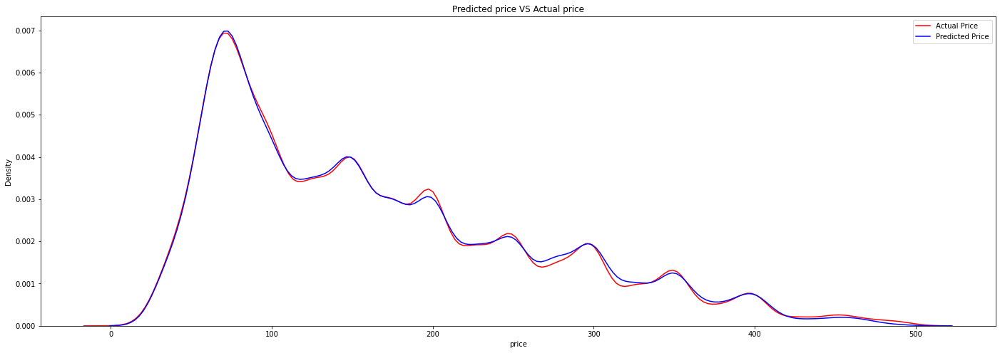

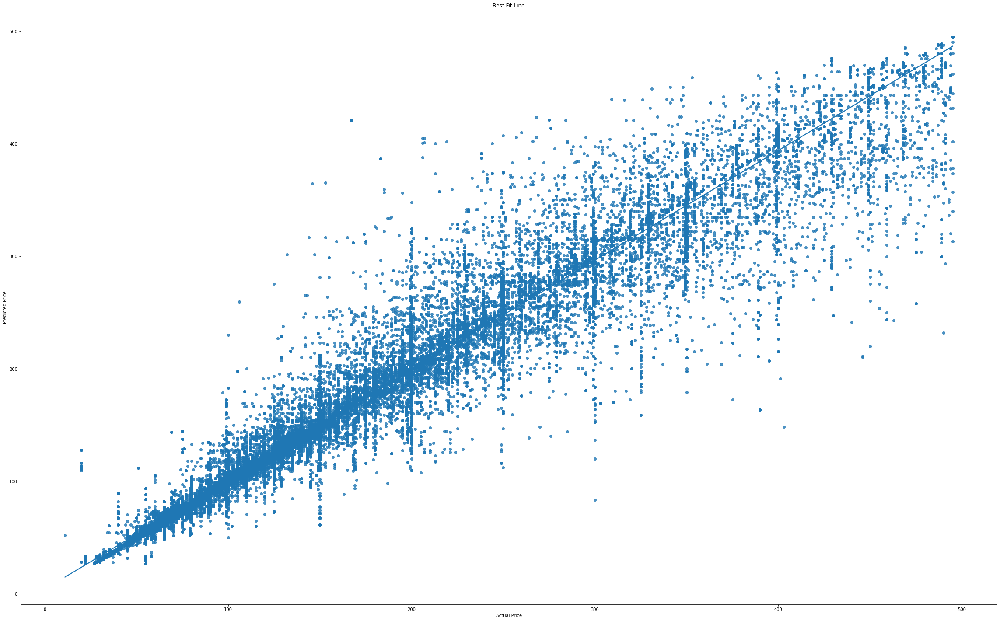

0.9742581861576468
{'n_estimators': 49}
Train R-squared: 0.97792	Train RMSE: $14.76332        
Test R-squared: 0.97416	Test RMSE: $15.99328
Time used =  202.82591271400452


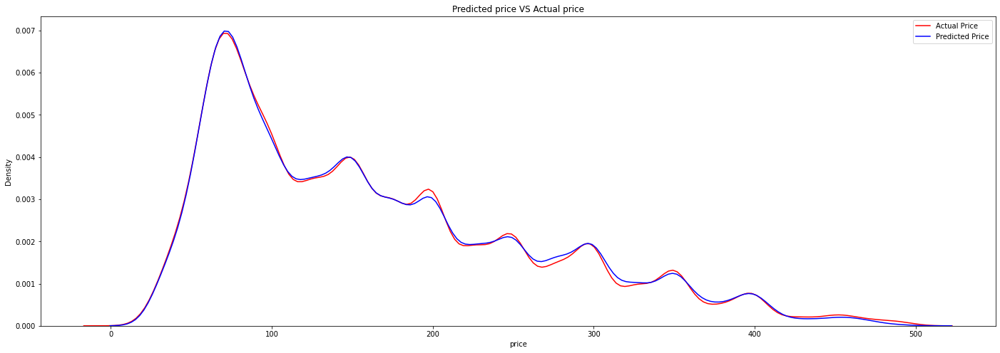

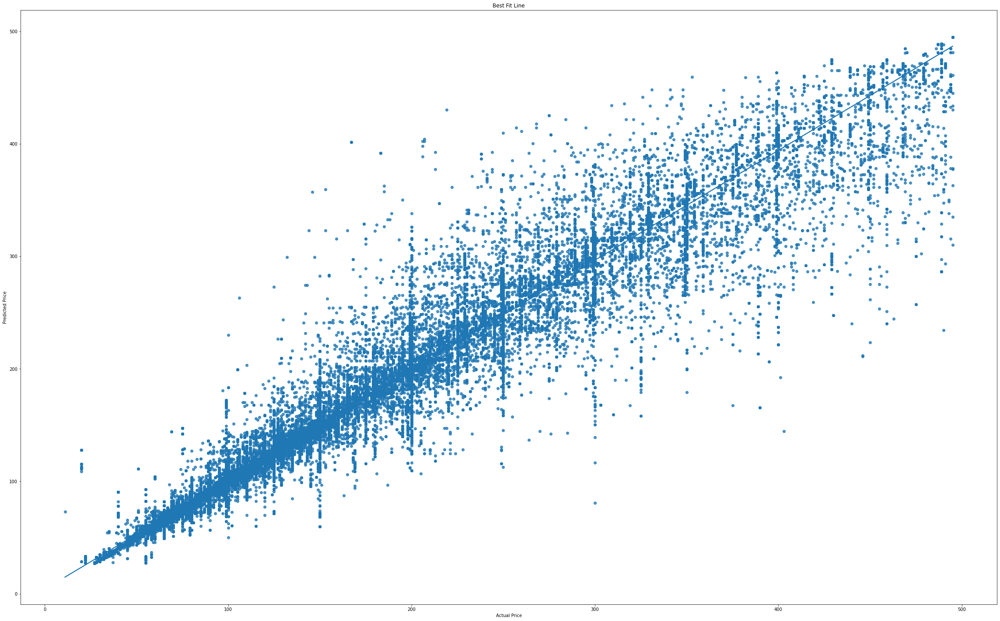

In [57]:
start = time()
forest_params = {
    'n_estimators':[30, 40, 50],
}
rf = RandomForestRegressor()
GridSearch = GridSearchCV(rf, forest_params, n_jobs=-1)
GridSearch.fit(X_train_reduced, y_train)
print(GridSearch.best_score_)
print(GridSearch.best_params_)
rf = RandomForestRegressor(**GridSearch.best_params_)
rf.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(rf, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["gridsearch_pca_rf"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

start = time()
forest_params = {
    'n_estimators':randint(21, 50)
    }
rf = RandomForestRegressor()
RandomSearch = RandomizedSearchCV(rf, forest_params, n_jobs=-1)
RandomSearch.fit(X_train_reduced, y_train)
print(RandomSearch.best_score_)
print(RandomSearch.best_params_)
rf = RandomForestRegressor(**RandomSearch.best_params_)
rf.fit(X_train_reduced, y_train)
r2train, r2test, rmse_train, rmse_test, y_pred = scores(rf, X_train_reduced, y_train, X_test_reduced, y_test)
end = time()
print("Time used = ", end - start)

fig = plt.figure(figsize=(24, 8))
ax1 = sns.kdeplot(data=y_test, color="r", label="Actual Price")
ax2 = sns.kdeplot(data=y_pred, color="b", label="Predicted Price")
ax1.set_title("Predicted price VS Actual price")
plt.legend()

plt.show()

fig = plt.figure(figsize=(40, 25))
ax3 = sns.regplot(x=y_test, y=y_pred)
plt.title("Best Fit Line")
ax3.set_xlabel("Actual Price")
ax3.set_ylabel("Predicted Price")
plt.show()

model_scores["randomsearch_pca_rf"]=[r2train, r2test, rmse_train, rmse_test]
time_used.append(end - start)

## Comparison between all the models

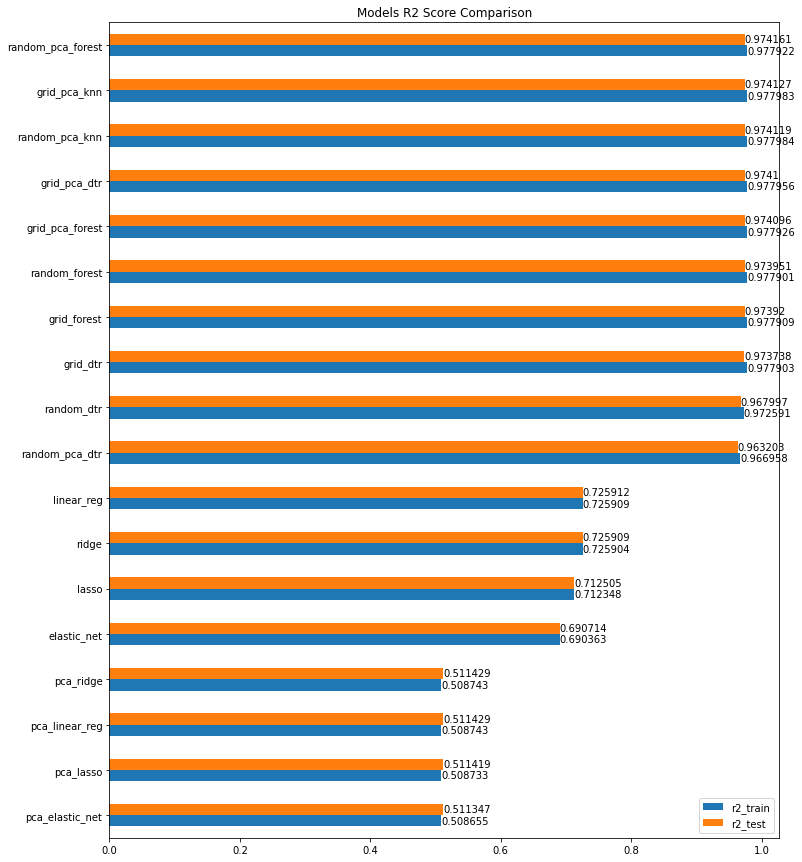

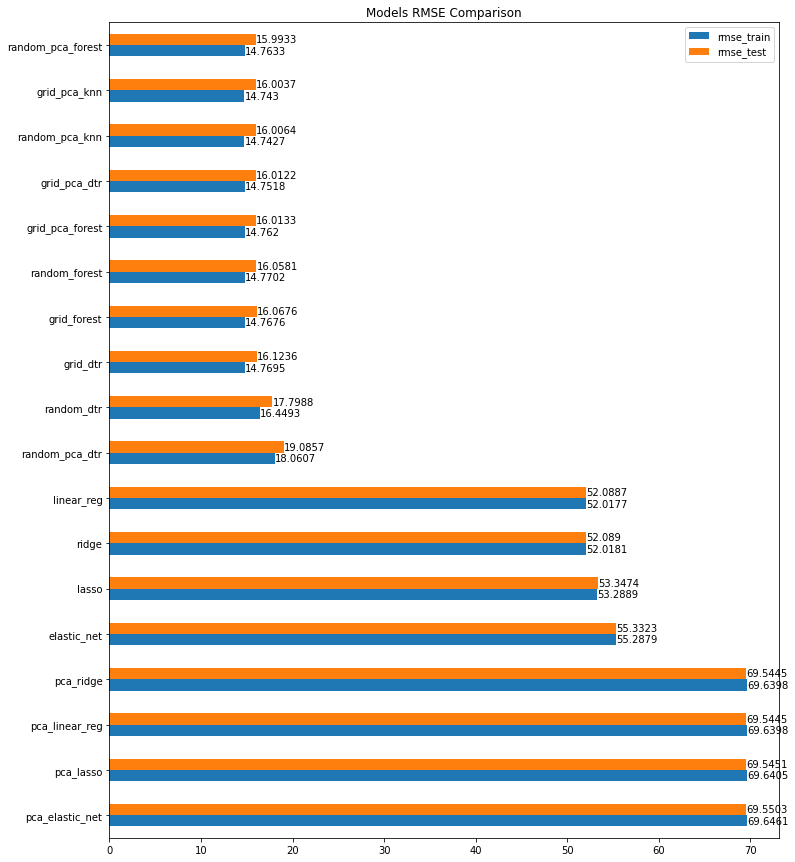

In [86]:
r2train, r2test, rmse_train, rmse_test = [], [], [], []
for key in list(model_scores.keys()):
    r2train.append(model_scores[key][0])
    r2test.append(model_scores[key][1])    
    rmse_train.append(model_scores[key][2])    
    rmse_test.append(model_scores[key][3])

model = [
    "linear_reg", "lasso", "ridge", "elastic_net",
    "grid_dtr", "random_dtr", "grid_forest", "random_forest",
    "pca_linear_reg", "pca_lasso", "pca_ridge", "pca_elastic_net",
    "grid_pca_knn", "random_pca_knn", "grid_pca_dtr", "random_pca_dtr",
    "grid_pca_forest", "random_pca_forest"
]    

r2 = pd.DataFrame({"r2_train":r2train, "r2_test":r2test}, index=model).sort_values("r2_test")
ax = r2.plot.barh(title="Models R2 Score Comparison", figsize=(12, 15))
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.show()

rmse = pd.DataFrame({"rmse_train":rmse_train, "rmse_test":rmse_test}, index=model).sort_values("rmse_test", ascending=False)
ax = rmse.plot.barh(title="Models RMSE Comparison", figsize=(12, 15))
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.show()



## Compare the time used for each model ordered by R2-Score

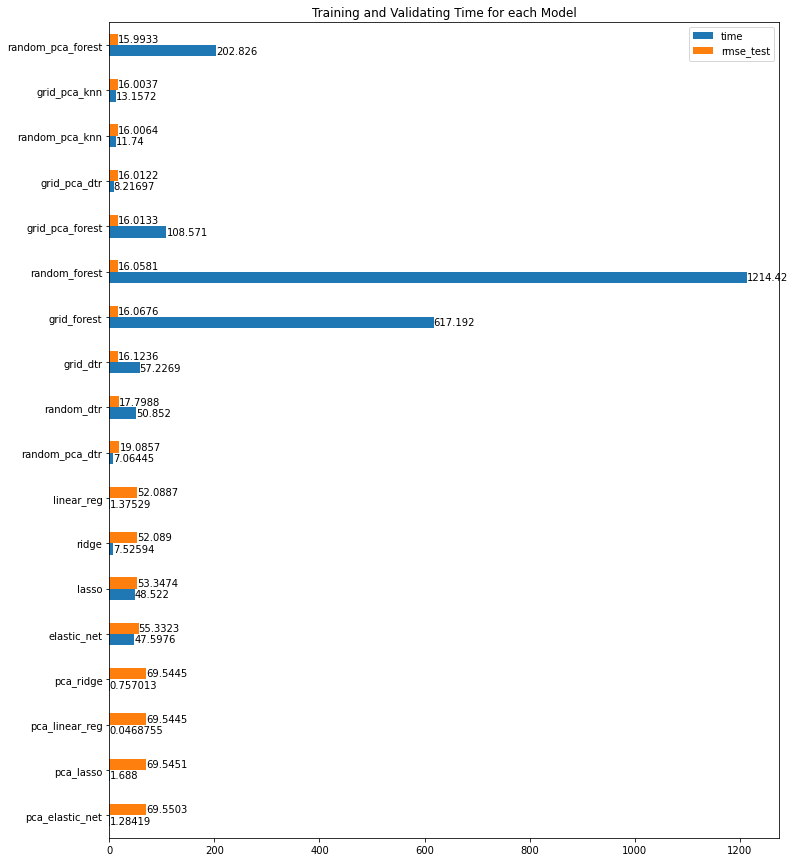

In [92]:
time_elapsed = pd.DataFrame({"time":time_used, "rmse_test":rmse_test}, index=model).sort_values("rmse_test", ascending=False)
ax = time_elapsed.plot.barh(title="Training and Validating Time for each Model", figsize=(12, 15))
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
plt.show()

## Visualize the top 15 features based on importance from the result of DTR and RF

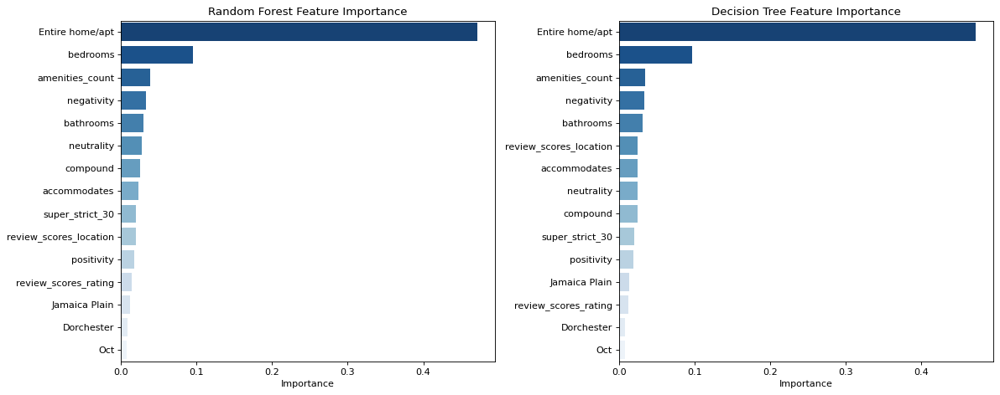

In [95]:
def filter_coefficients(keyword, coefficients_df):
    """
    Filters a dataframe of coefficients for specific features
    
    Parameters:
        keyword (str): The keyword to filter the features by
        coefficients_df (DataFrame): the coefficients df to filter by
    
    Returns:
        df (DataFrame): a keyword filtered dataframe of coefficients
    """
    
    df = coefficients_df[coefficients_df.\
                         features.str.contains(keyword)].copy()
    df.features = df.features.str.lstrip(keyword+'_')
    
    return df

def plot_coefficients(coefficients_df, ax=None, palette='icefire', xlabel='Coefficients', title=None):
    """Plots a horizontal barplot of the coefficients"""
    
    sns.barplot(
        y='features', x='coefficients',
        orient='h', data=coefficients_df,
        palette=palette,
        ax = ax
    )
    if ax:
        ax.set_xlabel(xlabel)
        ax.set_ylabel('')
        ax.set_title(title)
    else:
        plt.xlabel(xlabel)
        plt.ylabel('')
        plt.title(title)

def get_feature_importances(model):
    """Return sorted model feature importances"""
    
    df = pd.DataFrame(
        {'features': X.columns, 'coefficients': model.feature_importances_}
    ).sort_values(by='coefficients', ascending=False)[:15]
    return df
        
rf = RandomForestRegressor(n_estimators=46)
rf.fit(X_train, y_train)
dtr = DecisionTreeRegressor(max_depth=100, min_samples_split=10)
dtr.fit(X_train, y_train)
fig, axs = plt.subplots(1, 2, figsize=(15, 6), dpi=80)
plot_coefficients(
    get_feature_importances(rf), ax=axs[0], xlabel='Importance',
    title='Random Forest Feature Importance', palette='Blues_r')
plot_coefficients(
    get_feature_importances(dtr), ax=axs[1], xlabel='Importance',
    title='Decision Tree Feature Importance', palette='Blues_r')

plt.tight_layout()
plt.show()

# Discussions :
- At first, we train the models without remove the outliers, although the R2-score of decision tree model is quite good, around 0.90 to 0.92, the score for linear model is extremely low, around 0.45 to 0.6. After we remove all the outliers, R2-score of decision tree becomes around 0.94 to 0.98 while linear models become 0.65 to 0.72, which is a big improvement
- We train the original data with linear model and decision tree regressor and found that the decision tree regressor is more suitable to solve this problem
    - The performance(from good to bad) in descending order is decision tree followed by linear regression or ridge regression, lasso regression and the worst elastic net
    - We did not try with knn regressor because it is very time consuming
- We train the reduced data which left with 4 dimensions only with linear model, decision tree regressor and knn regressor and both knn regressor and decision tree regressor perform quite well
    - The performance in descending order(from good to bad) is decision tree or knn, followed by linear regression or ridge regression, lasso regression and the worst elastic net
    - The drop in performance of linear models may caused by the number of features=4 is too small
- The performance of Decision Tree Regressor is similar to the Random Forest Regressor but the time used for random forest regressor is very long compared to decision tree
- We can't compare random forest regressor with linear model since random forest is much complex model but we can compare decision tree with linear regression and knn model
- The performances of each model are in our expectation since this problem is basically just a if-else problem(decision tree) and "find the similarities"(knn) based on our experiences in real life
- In conclusion, our best model(random forest or knn or decision tree) trained can help the host to decide the suitable price for their listings with root mean squared error of $16 which is considered very good